# Context

In 1958 Keeling began continuous monitoring of atmospheric carbon dioxide concentrations from the Mauna Loa Observatory in Hawaii and soon observed a trend increase carbon dioxide levels in addition to the seasonal cycle. He was able to attribute this trend increase to growth in global rates of fossil fuel combustion. This trend has continued to the present, and is known as the "Keeling Curve."

In [1]:
library(tidyverse)
library(tsibble)
library(latex2exp)
library(ggplot2)
library(patchwork)
library(scatterplot3d)
library(forecast)
library(zoo)

theme_set(theme_minimal())

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘tsibble’


The following object is masked from ‘package:lubridate’:

    interval


The following objects are masked from ‘package:base’:

    intersect, setdiff, union


Registered S3 method overwritten by 'quantmod':
  method            from
  as.zoo.data.frame zoo 


Attaching package: ‘zoo’


The following object is masked from ‘package:tsibble’:

    index


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric




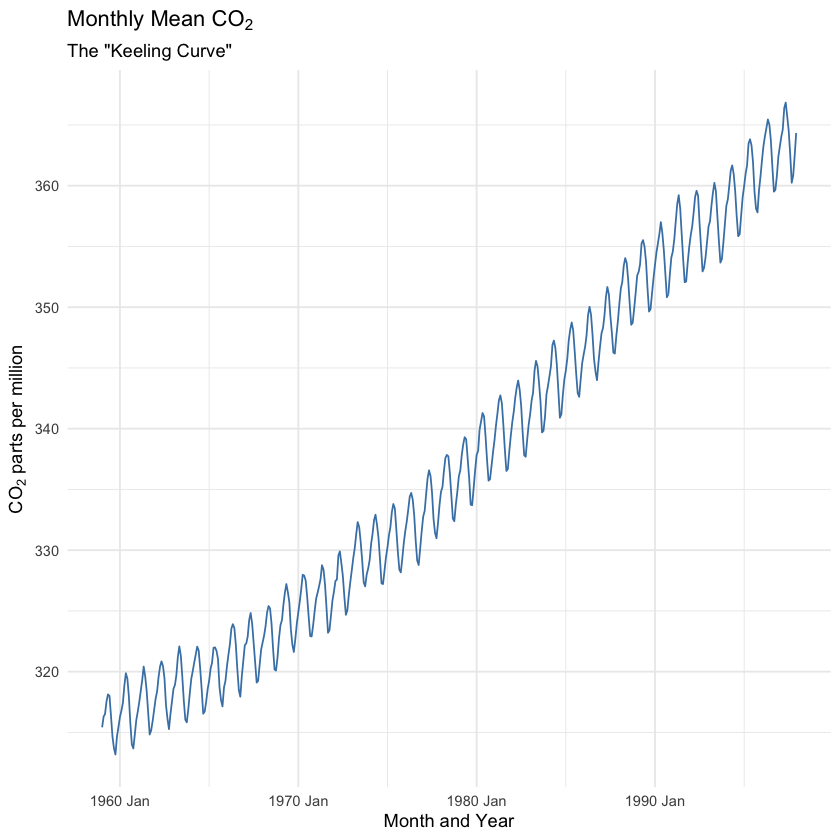

In [2]:
tsibble::as_tsibble(co2) %>%
  ggplot() + 
  aes(x=index, y=value) + 
  geom_line(color = 'steelblue') +
  labs(
    title = TeX(r'(Monthly Mean $CO_2$)'),
    subtitle = 'The "Keeling Curve"',
    x = 'Month and Year',
    y = TeX(r'($CO_2$ parts per million)')
  )

# Your Assignment 

Your goal in this assignment is to produce a comprehensive analysis of the Mona Loa CO2 data that you will be read by an interested, supervising data scientist. Rather than this being a final report, you might think of this as being a contribution to your laboratory. You and your group have been initially charged with the task of investigating the trends of global CO2, and told that if you find "anything interesting" that the team may invest more resources into assessing the question. 

Because this is the scenario that you are responding to: 

1. Your writing needs to be clear, well-reasoned, and concise. Your peers will be reading this, and you have a reputation to maintain.
2. Decisions that you make for your analysis need also be clear and well-reasoned. While the main narrative of your deliverable might only present the modeling choices that you determine are the most appropriate, there might exist supporting materials that examine what the consequences of other choices would be. As a concrete example, if you determine that a series is an AR(1) process your main analysis might provide the results of the critical test that led you to that determination and the results of the rest of the analysis under AR(1) modeling choices. However, in an appendix or separate document that is linked in your main report, you might show what a MA model would have meant for your results instead.
3. Your code and repository are a part of the deliverable. If you were to make a clear argument that this is a question worth pursuing, but then when the team turned to continue the work they found a repository that was a jumble of coding idioms, version-ed or outdated files, and skeletons it would be a disappointment.

# Report from the Point of View of 1997 

For the first part of this task, suspend reality for a short period of time and conduct your analysis from the point of view of a data scientist doing their work in the early months of 1998. Do this by using data that is included in _every_ R implementation, the `co2` dataset. This dataset is lazily loaded with every R instance, and is stored in an object called `co2`. 

## (3 points) Task 0a: Introduction [TODO]

Introduce the question to your audience. Suppose that they _could_ be interested in the question, but they don't have a deep background in the area. What is the question that you are addressing, why is it worth addressing, and what are you going to find at the completion of your analysis. Here are a few resource that you might use to start this motivation. 

- [Wikipedia](https://en.wikipedia.org/wiki/Keeling_Curve)
- [First Publication](./background/keeling_tellus_1960.pdf)
- [Autobiography of Keeling](./background/keeling_annual_review.pdf)

## (3 points) Task 1a: CO2 data
Conduct a comprehensive Exploratory Data Analysis on the `co2` series. This should include (without being limited to) a [description of how, where and why ](https://gml.noaa.gov/ccgg/about/co2_measurements.html) the data is generated, a thorough investigation of the trend, seasonal and irregular elements. Trends both in levels and growth rates should be discussed (consider expressing longer-run growth rates as annualized averages).

What you report in the deliverable should not be your own process of discovery, but rather a guided discussion that you have constructed so that your audience can come to an understanding as succinctly and successfully as possible. This means that figures should be thoughtfully constructed and what you learn from them should be discussed in text; to the extent that there is _any_ raw output from your analysis, you should intend for people to read and interpret it, and you should write your own interpretation as well. 

### Initial Data Load and Feature Engineering Pipeline

In [3]:
df = as_tsibble(co2)

month = list()
year = list()
count = 1

for (val in df[['index']]) {
    val = as.character(df[['index']][count])
    
    #Get Month and Year from Index
    strs = strsplit(val,' ')[[1]]
    month[[count]] = strs[2]
    year[[count]] = strs[1]
    
    count = count + 1
    
}

#Store year and month results, case index as time index
df[['month']] = as.character(month)
df[['year']] = as.numeric(year)
df[['index1']] = c(1:dim(df)[1])
df[['month_int']] = df[['index1']] %% 12
df["month_int"][df["month_int"] == 0] = 12



#Quadratic and Log features of Time
for (num in 2:10){
    
    df[[paste('index',num,sep='')]] = as.numeric(df[['index1']]**num)
}

df[['log_index']] = log(df[['index1']])
head(df)

index,value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index
<mth>,<dbl>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1959 Jan,315.42,Jan,1959,1,1,1,1,1,1,1,1,1,1,1,0.0000000
1959 Feb,316.31,Feb,1959,2,2,4,8,16,32,64,128,256,512,1024,0.6931472
1959 Mar,316.50,Mar,1959,3,3,9,27,81,243,729,2187,6561,19683,59049,1.0986123
1959 Apr,317.56,Apr,1959,4,4,16,64,256,1024,4096,16384,65536,262144,1048576,1.3862944
1959 May,318.13,May,1959,5,5,25,125,625,3125,15625,78125,390625,1953125,9765625,1.6094379
1959 Jun,318.00,Jun,1959,6,6,36,216,1296,7776,46656,279936,1679616,10077696,60466176,1.7917595


### CO2 Levels Over Time

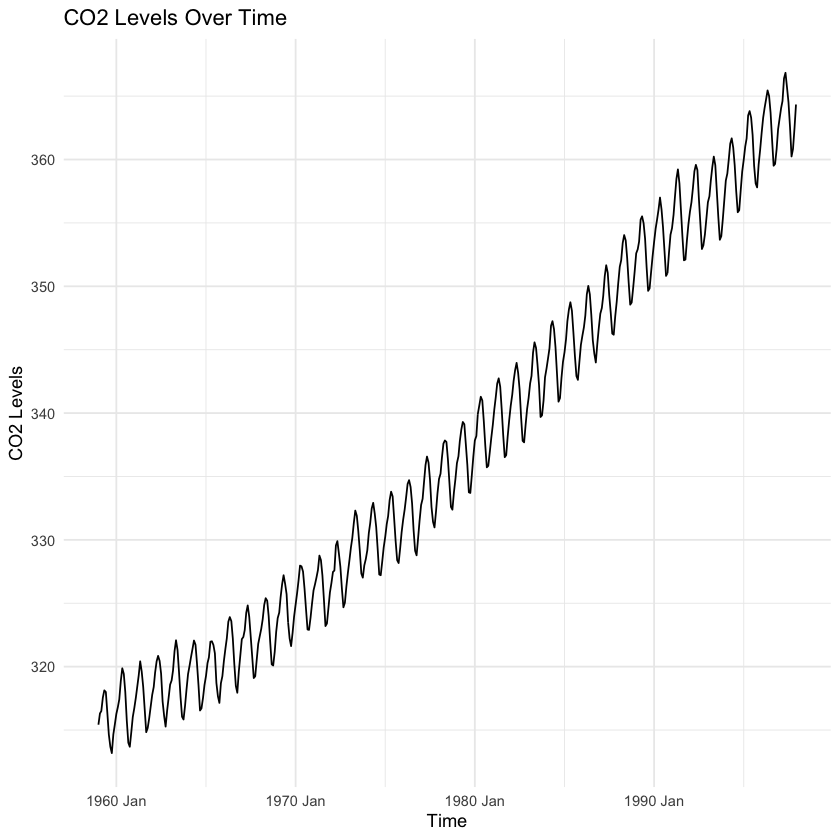

In [4]:
ggplot(df, aes(x = index, y = value)) +
  geom_line() +
  labs(
    title = "CO2 Levels Over Time",
    x = "Time",
    y = "CO2 Levels"
  )

### Average/SD CO2 Level Per Year

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


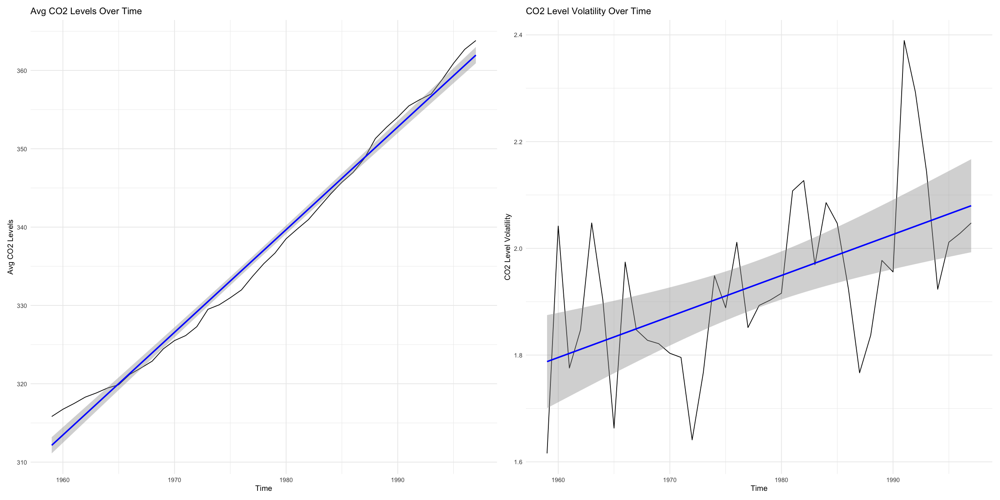

In [5]:
options(repr.plot.width = 20, repr.plot.height =10)

yrs = list()
means = list()
sds = list()

count = 1
for (yr in unique(df[['year']])) {
    
    avg = mean(subset(df,year == yr)[['value']])
    vol = sd(subset(df,year == yr)[['value']])
    yrs[[count]] = yr
    means[[count]] = avg
    sds[[count]] = vol
    
    count = count + 1
    
}

annual_df = data.frame(Index=1:length(yrs))
annual_df[['Years']] = as.numeric(yrs)
annual_df[['Avg_CO2']] = as.numeric(means)
annual_df[['SD_CO2']] = as.numeric(sds)

p1 = ggplot(annual_df, aes(x = Years, y = Avg_CO2)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = "Avg CO2 Levels Over Time",
    x = "Time",
    y = "Avg CO2 Levels"
  )

p2 = ggplot(annual_df, aes(x = Years, y = SD_CO2)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = "CO2 Level Volatility Over Time",
    x = "Time",
    y = "CO2 Level Volatility"
  )

p1 | p2

### Average/SD Monthly CO2 Levels

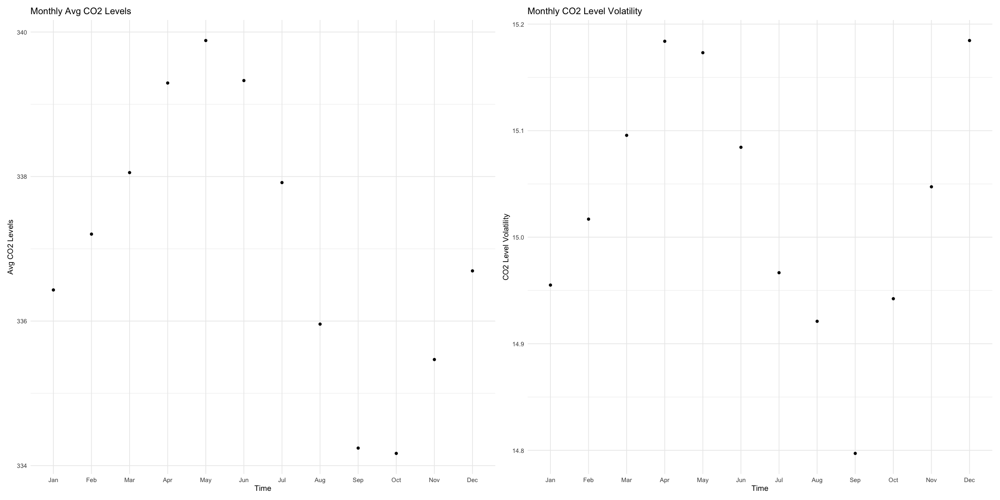

In [6]:
options(repr.plot.width = 20, repr.plot.height =10)

months = list()
means = list()
sds = list()

m_val = list('1'="Jan",
             '2'='Feb',
             '3'="Mar",
             '4'='Apr',
             '5'='May',
             '6'='Jun',
             '7'='Jul',
             '8'='Aug',
             '9'='Sep',
             '10'='Oct',
             '11'='Nov',
             '12'='Dec')
count = 1
for (val in unique(df[['month_int']])) {
    
    avg = mean(subset(df,month_int == val)[['value']])
    vol = sd(subset(df,month_int == val)[['value']])
    months[[count]] = m_val[[paste(val)]]
    means[[count]] = avg
    sds[[count]] = vol
    
    count = count + 1
    
}

months_df = data.frame(Index=1:length(months))
months_df[['Month']] = factor(as.character(months), 
                              levels = c('Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'))
months_df[['Avg_CO2']] = as.numeric(means)
months_df[['SD_CO2']] = as.numeric(sds)

p1 = ggplot(months_df, aes(x = Month, y = Avg_CO2)) +
  geom_point(stat = 'identity') +

  labs(
    title = "Monthly Avg CO2 Levels",
    x = "Time",
    y = "Avg CO2 Levels"
  )

p2 = ggplot(months_df, aes(x = Month, y = SD_CO2)) +
  geom_point(stat = 'identity') +

  labs(
    title = "Monthly CO2 Level Volatility",
    x = "Time",
    y = "CO2 Level Volatility"
  )

p1 | p2

## (3 points) Task 2a: Linear time trend model

Fit a linear time trend model to the `co2` series, and examine the characteristics of the residuals. Compare this to a quadratic time trend model. Discuss whether a logarithmic transformation of the data would be appropriate. Fit a polynomial time trend model that incorporates seasonal dummy variables, and use this model to generate forecasts to the year 2020. 

In [7]:
train = subset(df,year <= 1987)
test = subset(df, year > 1987)

### Linear Time Trend Model


Call:
lm(formula = value ~ index1, data = train)

Residuals:
    Min      1Q  Median      3Q     Max 
-5.1750 -1.7728  0.0833  1.7732  5.3100 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 3.129e+02  2.534e-01 1234.57   <2e-16 ***
index1      9.845e-02  1.259e-03   78.22   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.359 on 346 degrees of freedom
Multiple R-squared:  0.9465,	Adjusted R-squared:  0.9463 
F-statistic:  6118 on 1 and 346 DF,  p-value: < 2.2e-16


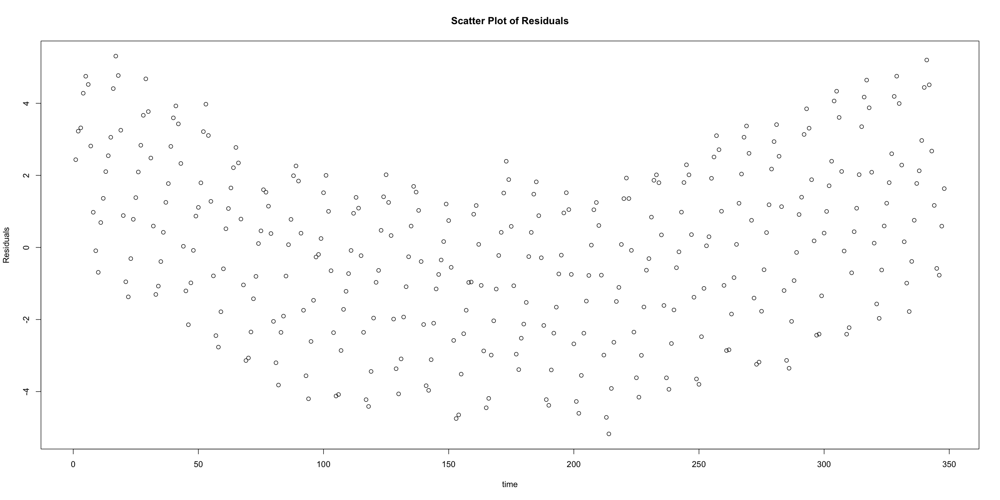

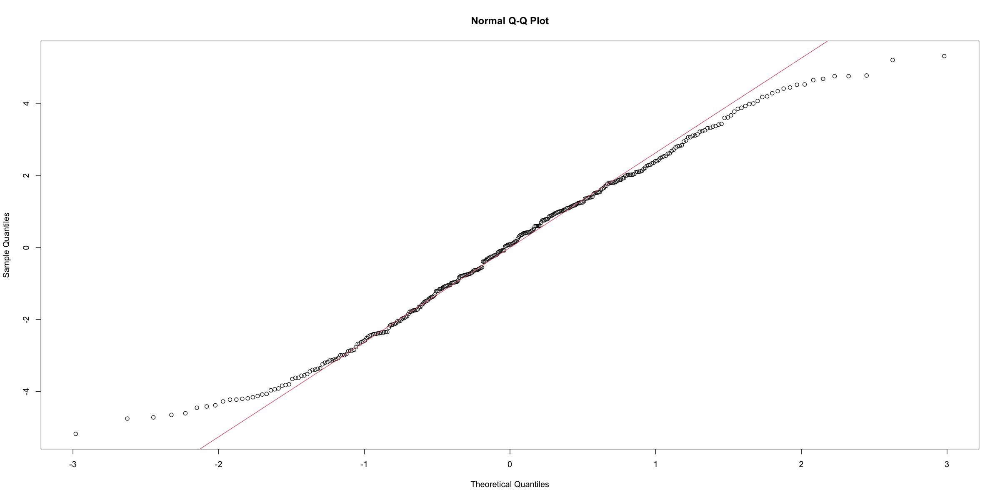

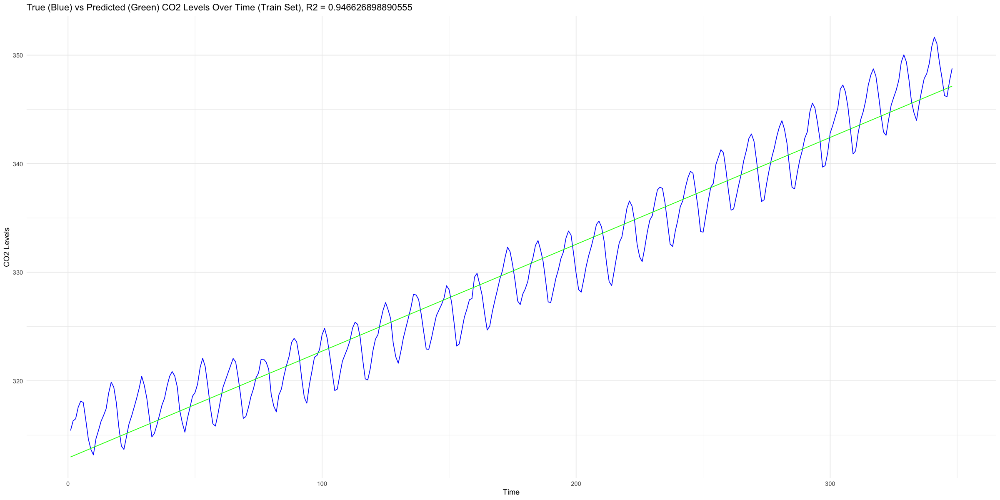

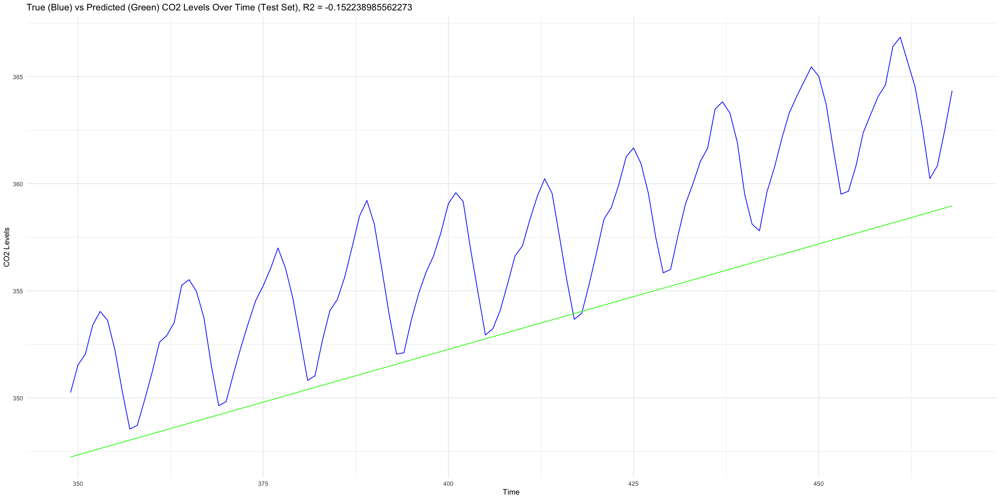

In [8]:
model1 = lm(value~index1,train)
summary(model1)

train_results = data.frame(value = train[['value']],
          preds = model1$fitted.values,
          resids = model1$residuals,
          index1 = train[['index1']])

plot(train_results[['index1']], 
     train_results[['resids']], 
     main = "Scatter Plot of Residuals", 
     xlab = "time", ylab = 
     "Residuals")

qqnorm(train_results[['resids']])
qqline(train_results[['resids']], col = 2)
train_r2 = 1 - mean((predict(model1,train) - train[['value']])**2) / var(train[['value']])

p1 = ggplot(train_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Train Set), R2 =",train_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p1

test_results = data.frame(value = test[['value']],
          preds = predict(model1, test),
          resids = test[['value']] - predict(model1, test),
          index1 = test[['index1']])

test_r2 = 1 - mean((predict(model1,test) - test[['value']])**2) / var(test[['value']])
p2 = ggplot(test_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Test Set), R2 =",test_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p2

### Quadratic Time Trend Model


Call:
lm(formula = value ~ index1 + index2, data = train)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.0574 -1.6451  0.2381  1.7404  3.7132 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 3.156e+02  3.303e-01  955.39   <2e-16 ***
index1      5.273e-02  4.370e-03   12.07   <2e-16 ***
index2      1.310e-04  1.213e-05   10.80   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.042 on 345 degrees of freedom
Multiple R-squared:   0.96,	Adjusted R-squared:  0.9598 
F-statistic:  4140 on 2 and 345 DF,  p-value: < 2.2e-16


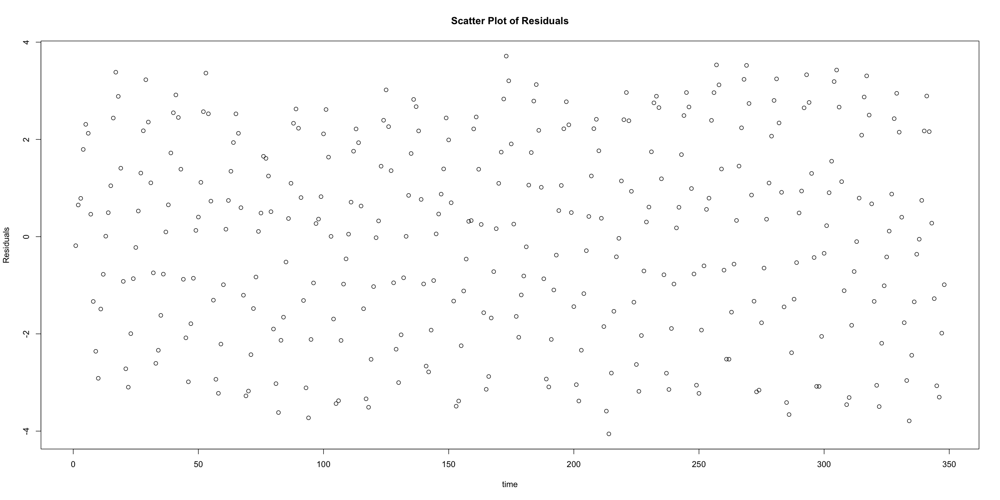

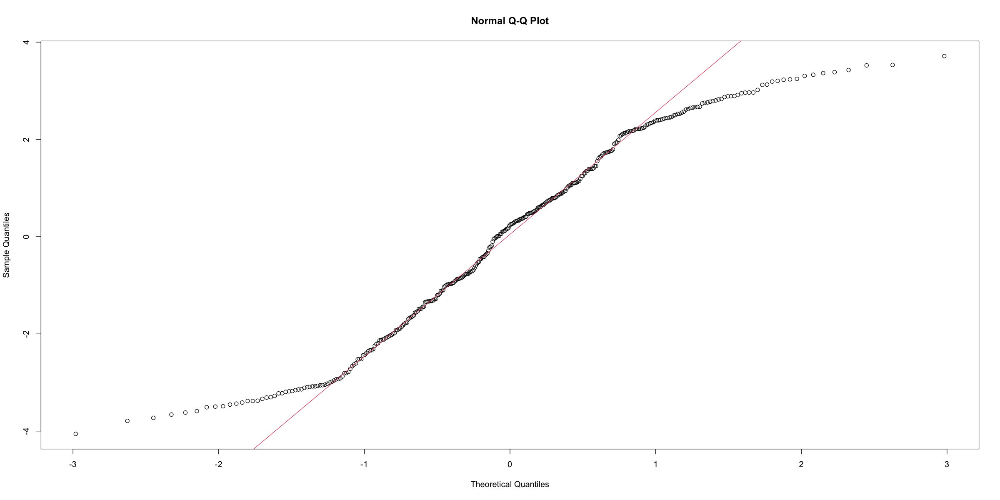

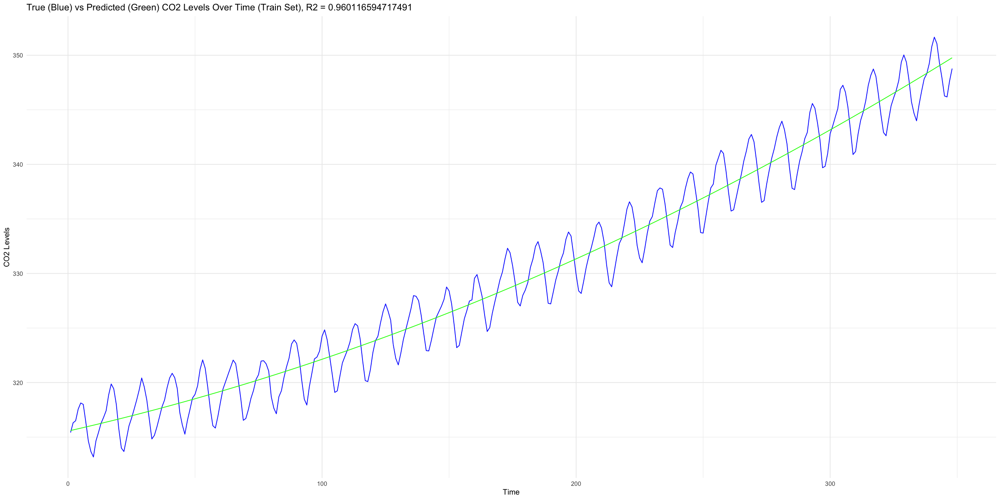

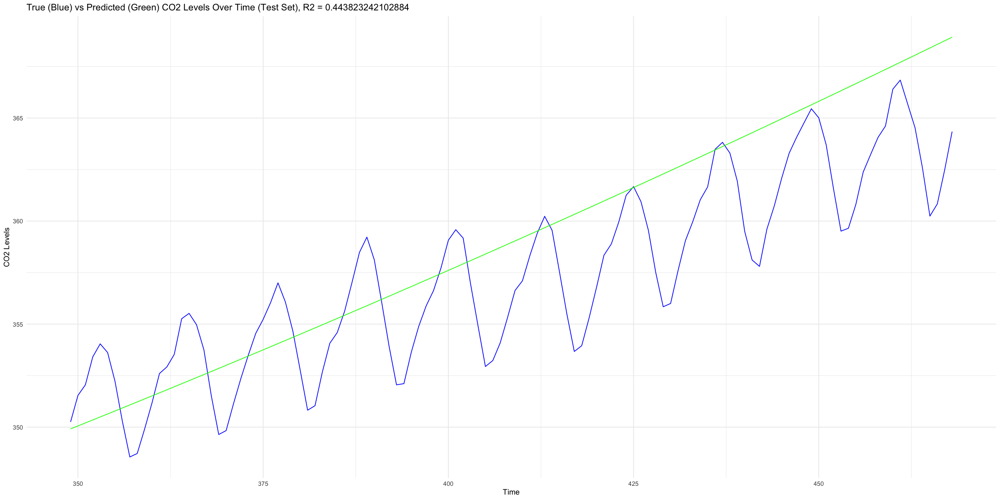

In [9]:
model1 = lm(value~index1 + index2,train)
summary(model1)

train_results = data.frame(value = train[['value']],
          preds = model1$fitted.values,
          resids = model1$residuals,
          index1 = train[['index1']])

plot(train_results[['index1']], 
     train_results[['resids']], 
     main = "Scatter Plot of Residuals", 
     xlab = "time", ylab = 
     "Residuals")

qqnorm(train_results[['resids']])
qqline(train_results[['resids']], col = 2)
train_r2 = 1 - mean((predict(model1,train) - train[['value']])**2) / var(train[['value']])

p1 = ggplot(train_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Train Set), R2 =",train_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p1

test_results = data.frame(value = test[['value']],
          preds = predict(model1, test),
          resids = test[['value']] - predict(model1, test),
          index1 = test[['index1']])

test_r2 = 1 - mean((predict(model1,test) - test[['value']])**2) / var(test[['value']])
p2 = ggplot(test_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Test Set), R2 =",test_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p2

### Quadratic Time Trend W/ Log(Time) Feature


Call:
lm(formula = value ~ index1 + index2 + log_index, data = train)

Residuals:
    Min      1Q  Median      3Q     Max 
-4.1351 -1.6430  0.2183  1.7217  3.6690 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.167e+02  1.035e+00 306.119  < 2e-16 ***
index1       6.292e-02  9.544e-03   6.593 1.63e-10 ***
index2       1.129e-04  1.934e-05   5.839 1.22e-08 ***
log_index   -4.567e-01  3.805e-01  -1.200    0.231    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2.041 on 344 degrees of freedom
Multiple R-squared:  0.9602,	Adjusted R-squared:  0.9598 
F-statistic:  2764 on 3 and 344 DF,  p-value: < 2.2e-16


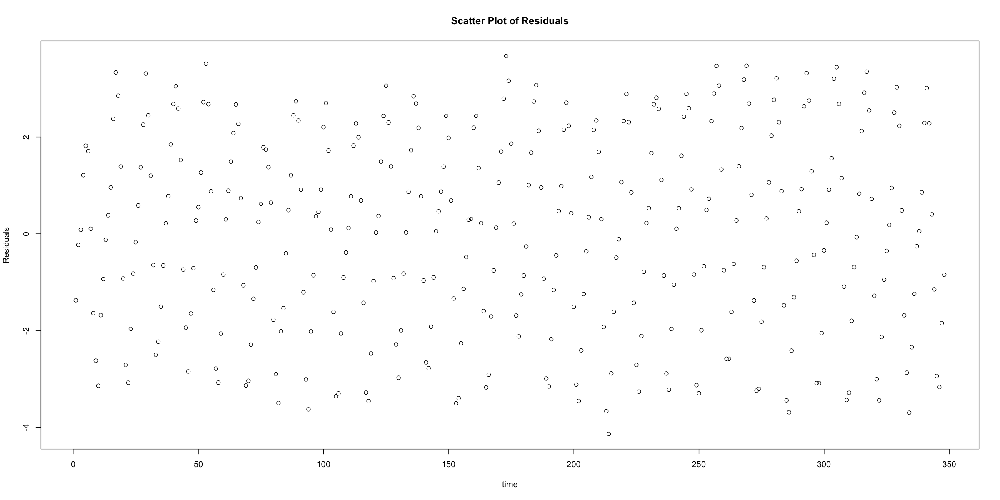

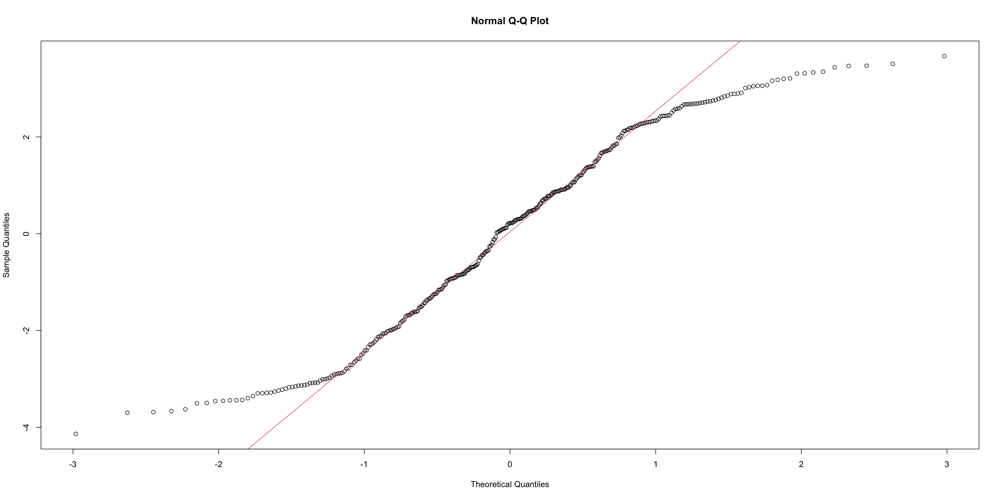

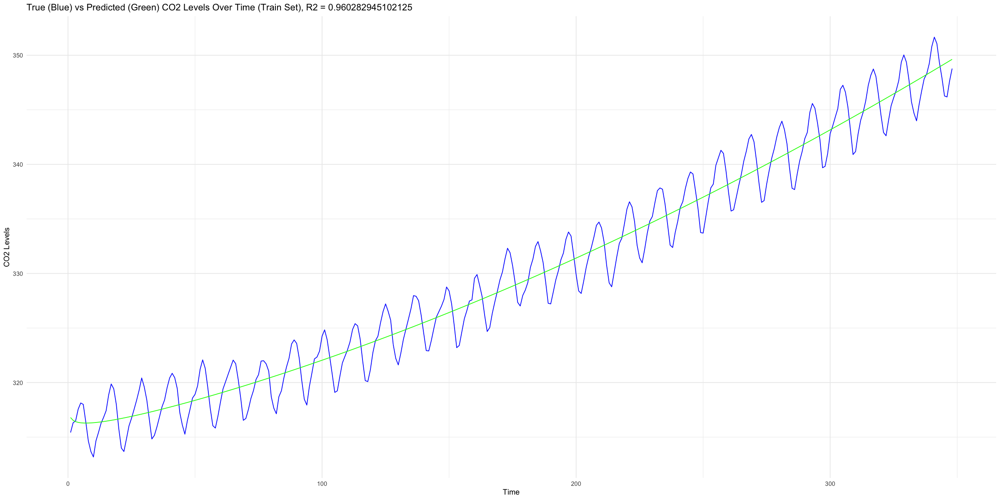

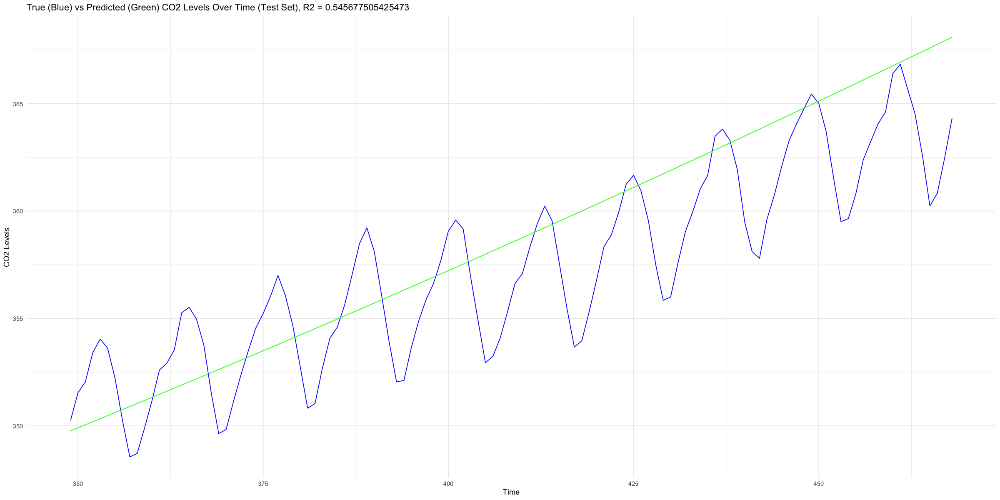

In [10]:
model1 = lm(value~index1 + index2 + log_index,train)
summary(model1)

train_results = data.frame(value = train[['value']],
          preds = model1$fitted.values,
          resids = model1$residuals,
          index1 = train[['index1']])

plot(train_results[['index1']], 
     train_results[['resids']], 
     main = "Scatter Plot of Residuals", 
     xlab = "time", ylab = 
     "Residuals")

qqnorm(train_results[['resids']])
qqline(train_results[['resids']], col = 2)
train_r2 = 1 - mean((predict(model1,train) - train[['value']])**2) / var(train[['value']])

p1 = ggplot(train_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Train Set), R2 =",train_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p1

test_results = data.frame(value = test[['value']],
          preds = predict(model1, test),
          resids = test[['value']] - predict(model1, test),
          index1 = test[['index1']])

test_r2 = 1 - mean((predict(model1,test) - test[['value']])**2) / var(test[['value']])
p2 = ggplot(test_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Test Set), R2 =",test_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p2

### Polynomial Time Trend Model

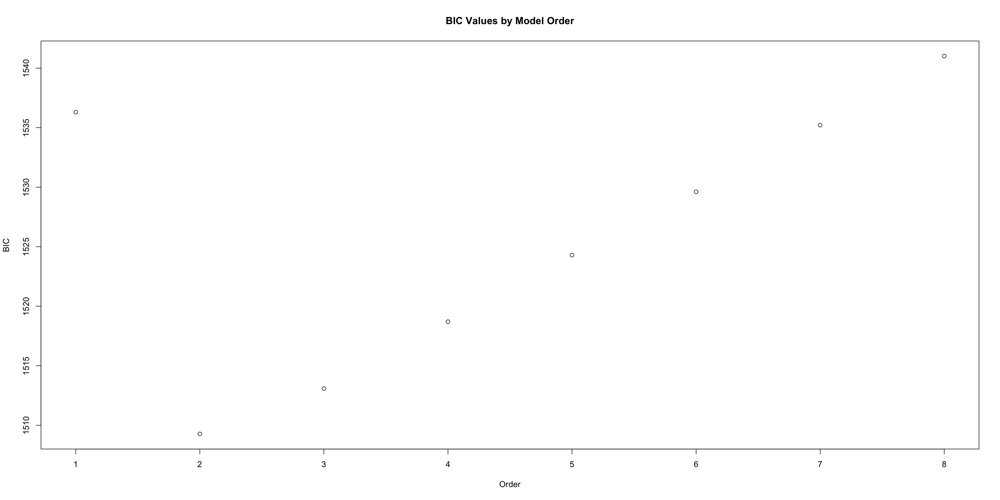


Call:
lm(formula = value ~ index1 + index2 + log_index + month, data = train)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.22054 -0.24759 -0.02343  0.28527  1.40657 

Coefficients:
              Estimate Std. Error  t value Pr(>|t|)    
(Intercept)  3.183e+02  2.257e-01 1410.394  < 2e-16 ***
index1       5.622e-02  1.970e-03   28.535  < 2e-16 ***
index2       1.256e-04  3.990e-06   31.476  < 2e-16 ***
log_index   -1.385e-01  7.866e-02   -1.761   0.0791 .  
monthAug    -3.582e+00  1.103e-01  -32.482  < 2e-16 ***
monthDec    -3.373e+00  1.103e-01  -30.574  < 2e-16 ***
monthFeb    -1.864e+00  1.103e-01  -16.905  < 2e-16 ***
monthJan    -2.514e+00  1.103e-01  -22.788  < 2e-16 ***
monthJul    -1.571e+00  1.103e-01  -14.245  < 2e-16 ***
monthJun    -1.102e-01  1.103e-01   -1.000   0.3181    
monthMar    -1.109e+00  1.102e-01  -10.056  < 2e-16 ***
monthMay     4.929e-01  1.102e-01    4.471 1.07e-05 ***
monthNov    -4.445e+00  1.103e-01  -40.293  < 2e-16 ***
monthOct    -5.605

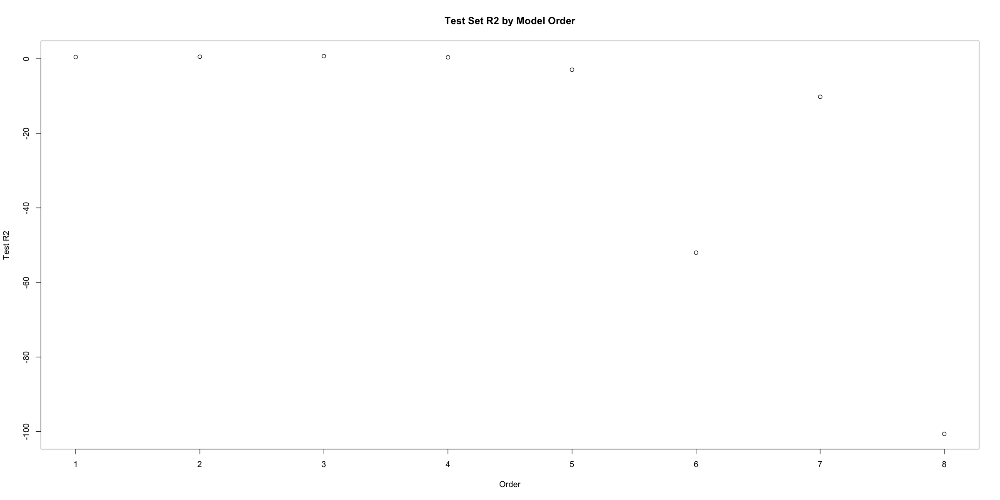

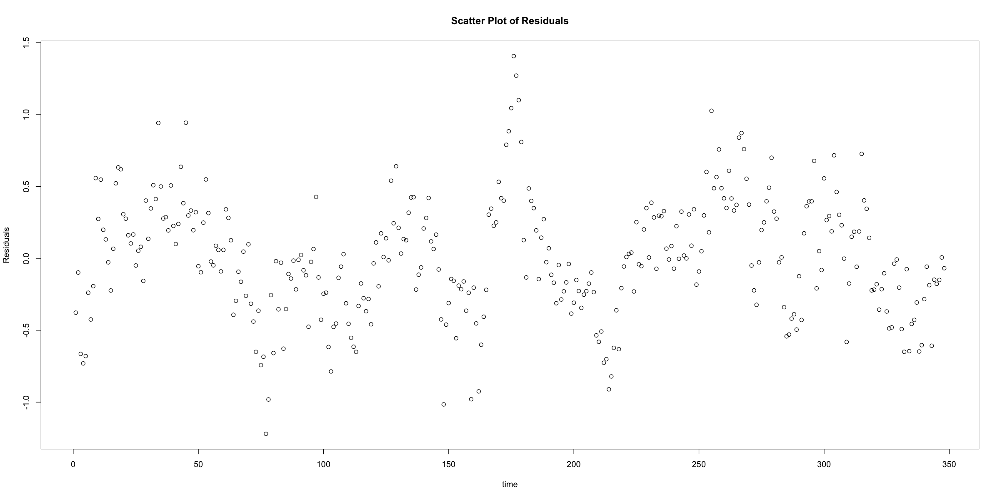

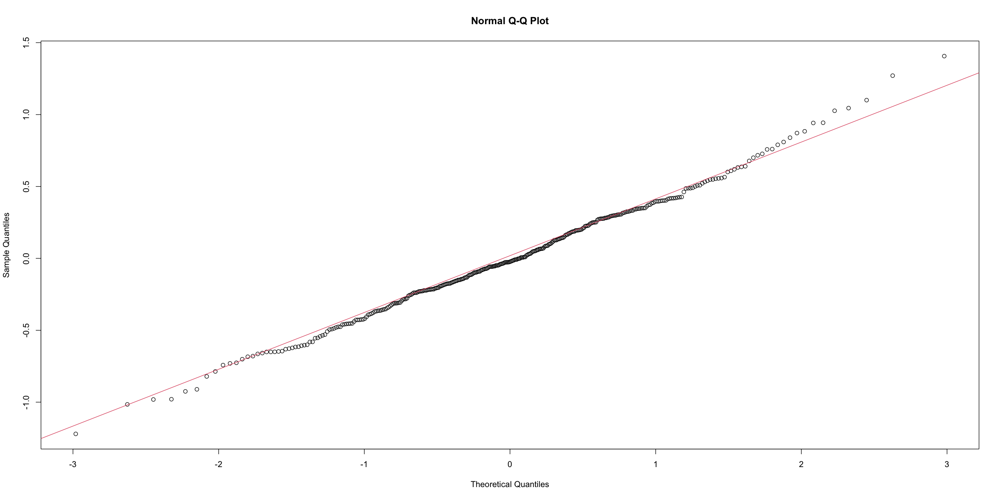

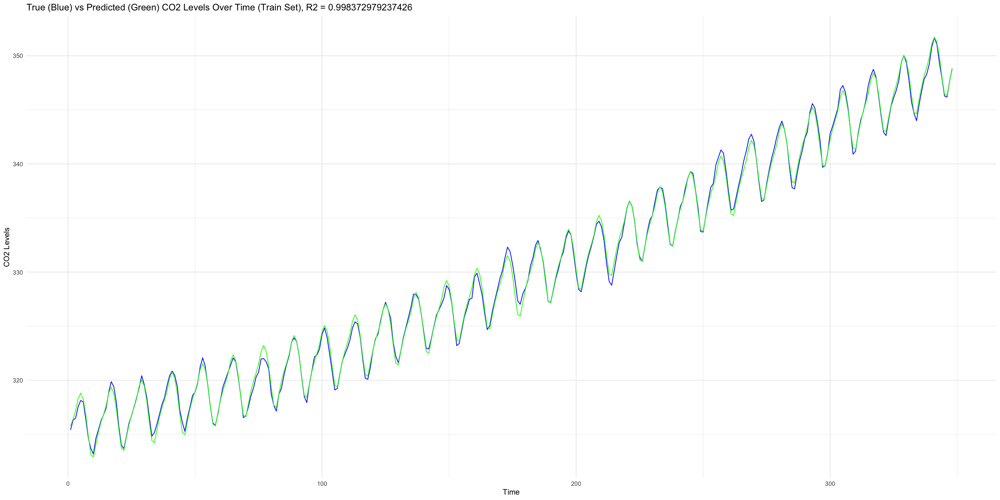

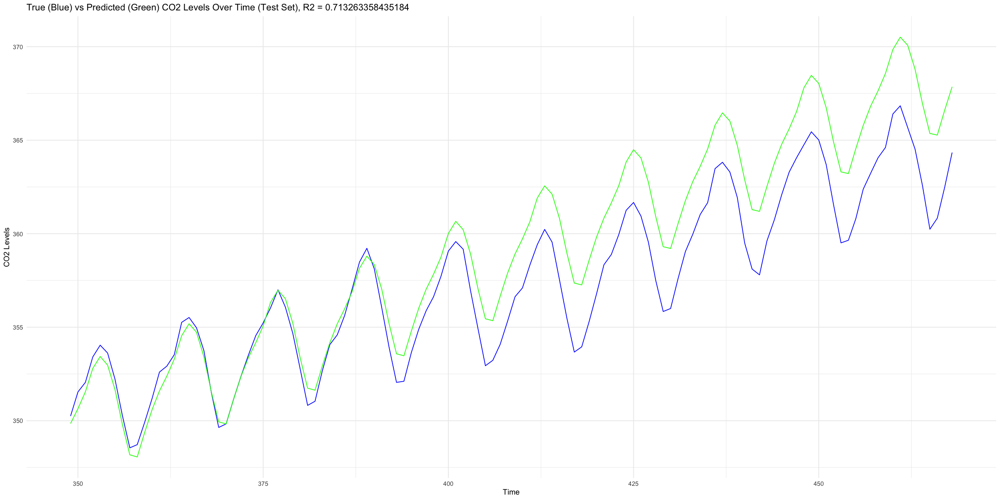

In [11]:
#Find Optimal Model Order
bic_values = list()
test_r2_values = list()

model = lm(value~index1 + log_index,train)
bic_values[[1]] = BIC(model)
test_r2_values[[1]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2 + log_index,train)
bic_values[[2]] = BIC(model)
test_r2_values[[2]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3 + log_index,train)
bic_values[[3]] = BIC(model)
test_r2_values[[3]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3+index4 + log_index,train)
bic_values[[4]] = BIC(model)
test_r2_values[[4]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3+index4+index5 + log_index,train)
bic_values[[5]] = BIC(model)
test_r2_values[[5]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3+index4+index5+index6 + log_index,train)
bic_values[[6]] = BIC(model)
test_r2_values[[6]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3+index4+index5+index6+index7 + log_index,train)
bic_values[[7]] = BIC(model)
test_r2_values[[7]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

model = lm(value~index1+index2+index3+index4+index5+index6+index7+index8 + log_index,train)
bic_values[[8]] = BIC(model)
test_r2_values[[8]] = 1 - mean((predict(model,test) - test[['value']])**2) / var(test[['value']])

plot(1:8, 
     bic_values, 
     main = "BIC Values by Model Order", 
     xlab = "Order", ylab = 
     "BIC")

plot(1:8, 
     test_r2_values, 
     main = "Test Set R2 by Model Order", 
     xlab = "Order", ylab = 
     "Test R2")


model1 = lm(value~index1+index2+log_index +month,train)
summary(model1)

train_results = data.frame(value = train[['value']],
          preds = model1$fitted.values,
          resids = model1$residuals,
          index1 = train[['index1']])

plot(train_results[['index1']], 
     train_results[['resids']], 
     main = "Scatter Plot of Residuals", 
     xlab = "time", ylab = 
     "Residuals")

qqnorm(train_results[['resids']])
qqline(train_results[['resids']], col = 2)
train_r2 = 1 - mean((predict(model1,train) - train[['value']])**2) / var(train[['value']])

p1 = ggplot(train_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Train Set), R2 =",train_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p1

test_results = data.frame(value = test[['value']],
          preds = predict(model1, test),
          resids = test[['value']] - predict(model1, test),
          index1 = test[['index1']])

test_r2 = 1 - mean((predict(model1,test) - test[['value']])**2) / var(test[['value']])
p2 = ggplot(test_results) +
  geom_line(aes(x = index1, y = value), color = 'blue') +
  geom_line(aes(x = index1, y = preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Predicted (Green) CO2 Levels Over Time (Test Set), R2 =",test_r2),
    x = "Time",
    y = "CO2 Levels"
  )

p2

### Train Final Linear Model

In [12]:
final_model = lm(value~index1+index2+log_index + month,df)
BIC(final_model)
summary(final_model)

[1] 1034.196


Call:
lm(formula = value ~ index1 + index2 + log_index + month, data = df)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.97460 -0.45183 -0.05224  0.42222  1.89269 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.199e+02  3.298e-01 969.953  < 2e-16 ***
index1       8.327e-02  1.977e-03  42.114  < 2e-16 ***
index2       6.795e-05  2.994e-06  22.695  < 2e-16 ***
log_index   -9.371e-01  1.050e-01  -8.926  < 2e-16 ***
monthAug    -3.751e+00  1.514e-01 -24.777  < 2e-16 ***
monthDec    -3.440e+00  1.514e-01 -22.717  < 2e-16 ***
monthFeb    -1.894e+00  1.514e-01 -12.511  < 2e-16 ***
monthJan    -2.577e+00  1.514e-01 -17.016  < 2e-16 ***
monthJul    -1.687e+00  1.514e-01 -11.147  < 2e-16 ***
monthJun    -1.714e-01  1.514e-01  -1.132  0.25803    
monthMar    -1.140e+00  1.514e-01  -7.529  2.8e-13 ***
monthMay     4.857e-01  1.514e-01   3.209  0.00143 ** 
monthNov    -4.560e+00  1.514e-01 -30.112  < 2e-16 ***
monthOct    -5.752e+00  1.514e-01 -

### Generate Feature Data for Forecast, Use Linear Time Trend Model to Forecast

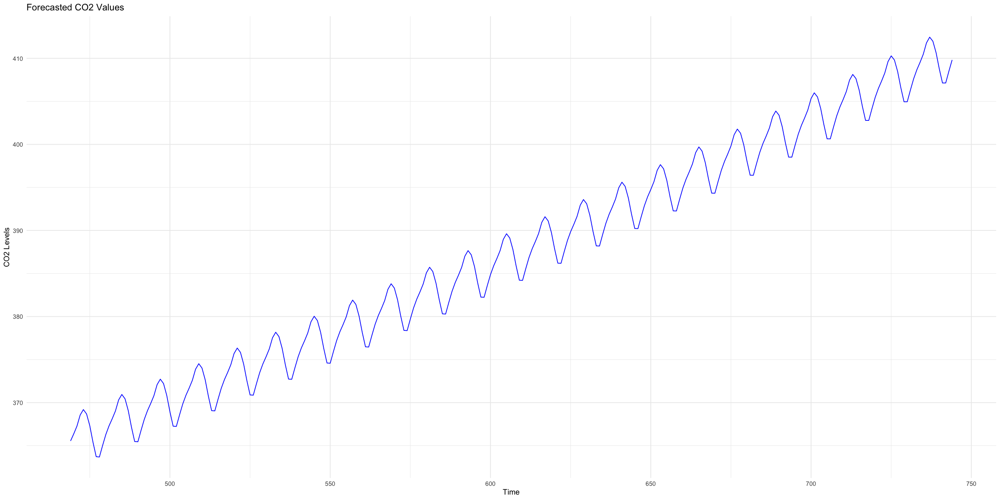

In [13]:
start_year = 1998
end_year = 2021
start_index = 469
month_count = 1

rows = data.frame()
count = 1
while (start_year < end_year){
    row = c(year = start_year,
               index1 = start_index,
               index2 = start_index**2, 
               index3 = start_index**3,
               log_index = log(start_index),
               month = m_val[[paste(month_count)]])
    rows = append(rows,row)
    count = count + 1
    start_index = start_index + 1
    month_count = month_count + 1
    if (month_count >= 13){
        month_count = 1
        start_year = start_year + 1
    }
}

rows = data.frame(t(matrix(rows,nrow = 6)))
colnames(rows) = c('year','index1','index2','index3','log_index','month')

for (col in c('index1','index2','index3','log_index')) {
    rows[[col]] = as.numeric(rows[[col]])
}

for (col in c('year','month')) {
    rows[[col]] = as.character(rows[[col]])
}

rows[['preds']] = predict(final_model,rows)

ggplot(rows) +
  geom_line(aes(x = index1, y = preds), color = 'blue') +

  labs(
    title = 'Forecasted CO2 Values',
    x = "Time",
    y = "CO2 Levels"
  )

## (3 points) Task 3a: ARIMA times series model 

Following all appropriate steps, choose an ARIMA model to fit to the series. Discuss the characteristics of your model and how you selected between alternative ARIMA specifications. Use your model (or models) to generate forecasts to the year 2022. 

### Detrend CO2 Series such that it is stationary -- use linear model to detrend series as it captures linear / nonlinear temporal and seasonal trends

In [14]:
df2 = df
df2[['diff_value']] = final_model$residuals

head(df2)

index,value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,diff_value
<mth>,<dbl>,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1959 Jan,315.42,Jan,1959,1,1,1,1,1,1,1,1,1,1,1,0.0000000,-1.9745960
1959 Feb,316.31,Feb,1959,2,2,4,8,16,32,64,128,256,512,1024,0.6931472,-1.2013904
1959 Mar,316.50,Mar,1959,3,3,9,27,81,243,729,2187,6561,19683,59049,1.0986123,-1.4693564
1959 Apr,317.56,Apr,1959,4,4,16,64,256,1024,4096,16384,65536,262144,1048576,1.3862944,-1.3631307
1959 May,318.13,May,1959,5,5,25,125,625,3125,15625,78125,390625,1953125,9765625,1.6094379,-1.1536022
1959 Jun,318.00,Jun,1959,6,6,36,216,1296,7776,46656,279936,1679616,10077696,60466176,1.7917595,-0.5396437


### Check Mean/Variance of Series over time to visually validate stationarity assumptions

`geom_smooth()` using formula = 'y ~ x'


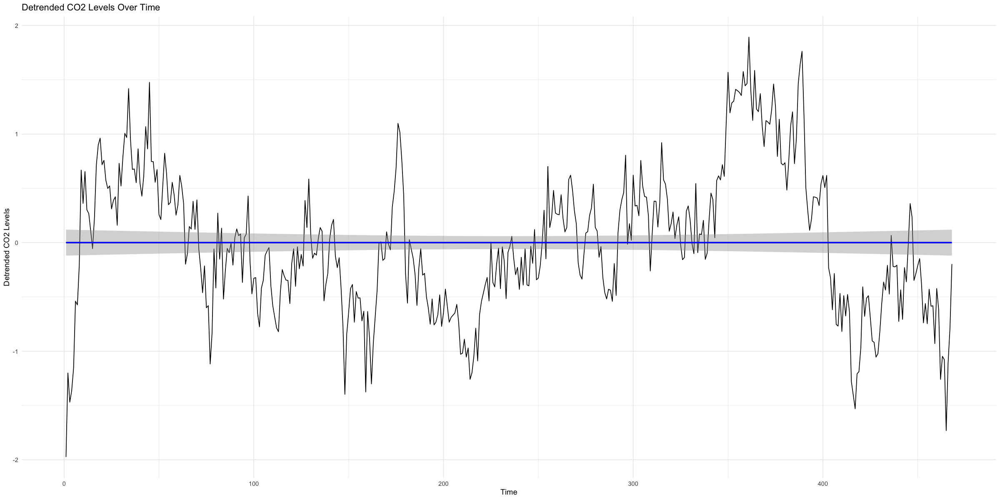

In [15]:
ggplot(df2, aes(x = index1, y = diff_value)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = "Detrended CO2 Levels Over Time",
    x = "Time",
    y = "Detrended CO2 Levels"
  )

### Check ACF/PACF Plots

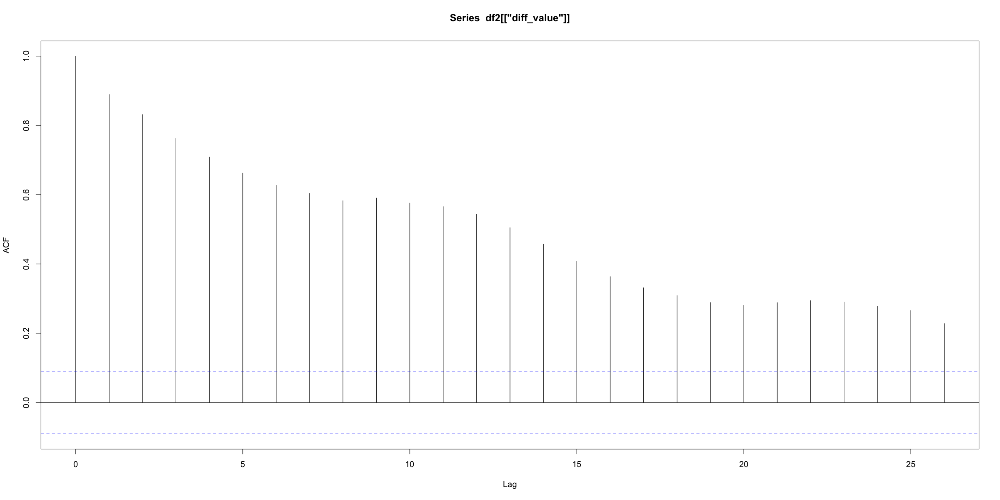

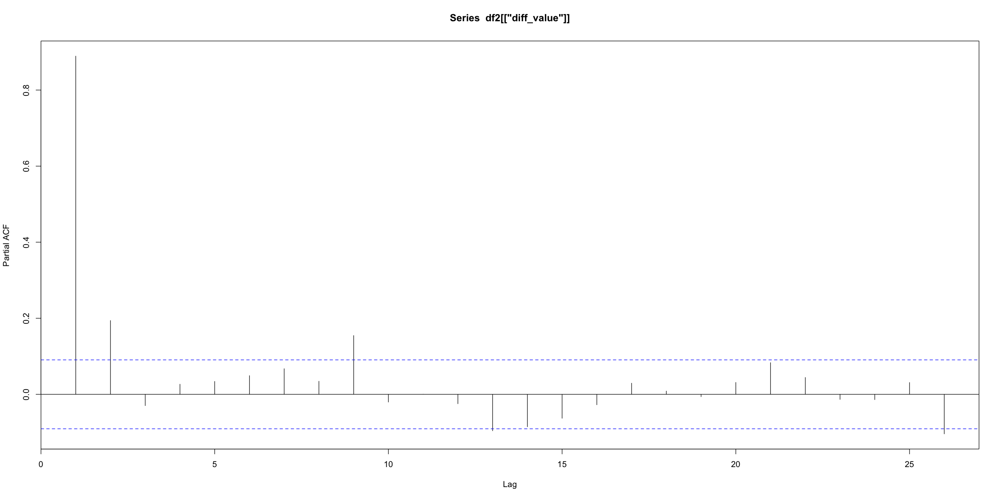

In [16]:
acf(df2[['diff_value']])
pacf(df2[['diff_value']])

### Grid Search to Find P, Q Values that Minimize In Sample BIC

In [17]:
rows = list()

for (p in 1:10){
    
    for (q in 0:5) {
        
        suppressWarnings({
            rows = append(rows,c(p,q,BIC(arima(df2[['diff_value']], order=c(p,0,q)))))
            
            })
    }
}

rows = data.frame(t(matrix(rows,nrow = 3)))
colnames(rows) = c('P','Q','BICVal')

for (col in colnames(rows)) {
    
    rows[[col]] = as.numeric(rows[[col]])
    
}

In [18]:
head(rows,5)

,P,Q,BICVal
,<dbl>,<dbl>,<dbl>
1,1,0,187.3329
2,1,1,177.2226
3,1,2,182.7279
4,1,3,186.6402
5,1,4,192.3381


### Plot BIC @ Various P,Q Levels and Train Final ARIMA Model

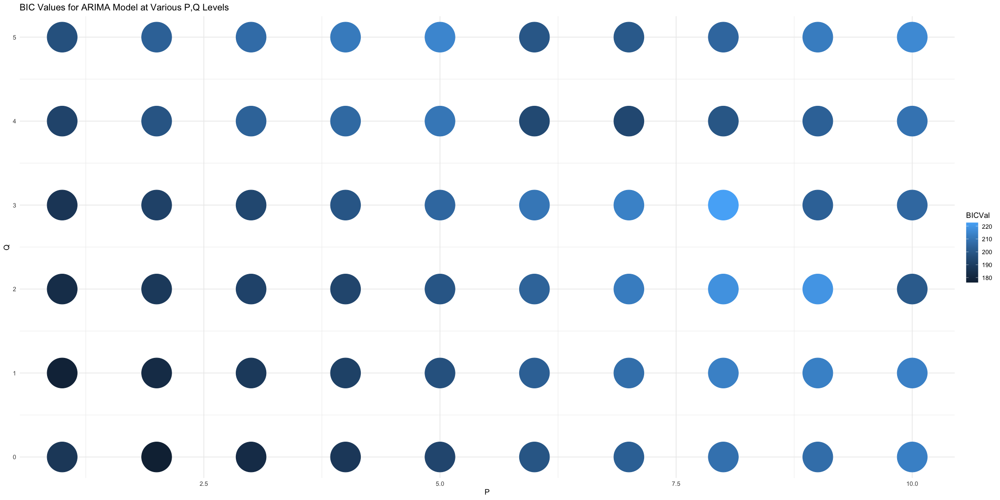

In [19]:
ggplot(rows, aes(x = P, y = Q)) +
  geom_point(size = 20, aes(color = BICVal)) +

  labs(
    title = 'BIC Values for ARIMA Model at Various P,Q Levels',
    x = "P",
    y = "Q"
  )

In [20]:
subset(rows,BICVal == min(rows[['BICVal']]))

,P,Q,BICVal
,<dbl>,<dbl>,<dbl>
7,2,0,176.1799


In [21]:
arima_model = arima(df2[['diff_value']], order=c(2,0,0))
train_r2 = 1 - sum((arima_model$residuals**2)) / (var(df2[['diff_value']])*length(arima_model$residuals))
arima_model
train_r2


Call:
arima(x = df2[["diff_value"]], order = c(2, 0, 0))

Coefficients:
         ar1     ar2  intercept
      0.7312  0.1935    -0.0609
s.e.  0.0459  0.0461     0.1699

sigma^2 estimated as 0.08063:  log likelihood = -75.79,  aic = 159.59

[1] 0.8139438

### Validate Residuals Are White Noise, Approximately Normally Distributed

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
`geom_smooth()` using formula = 'y ~ x'


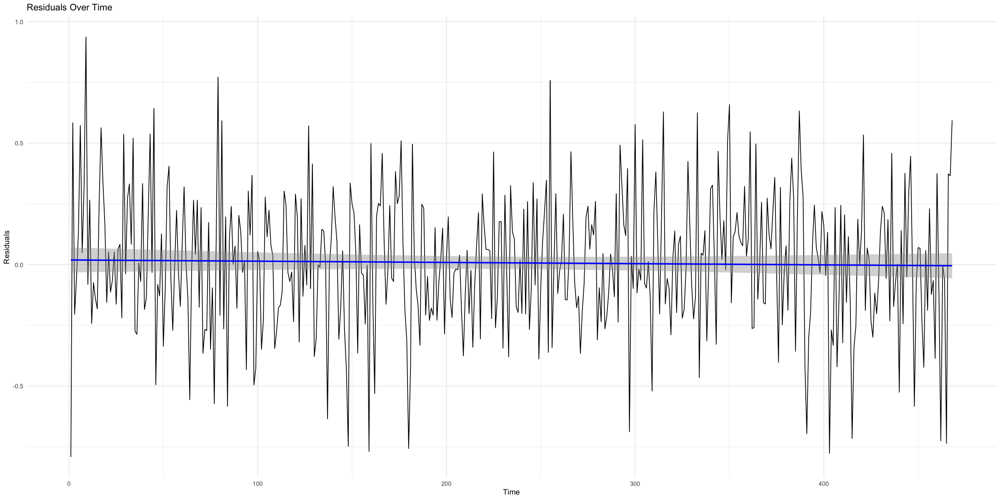

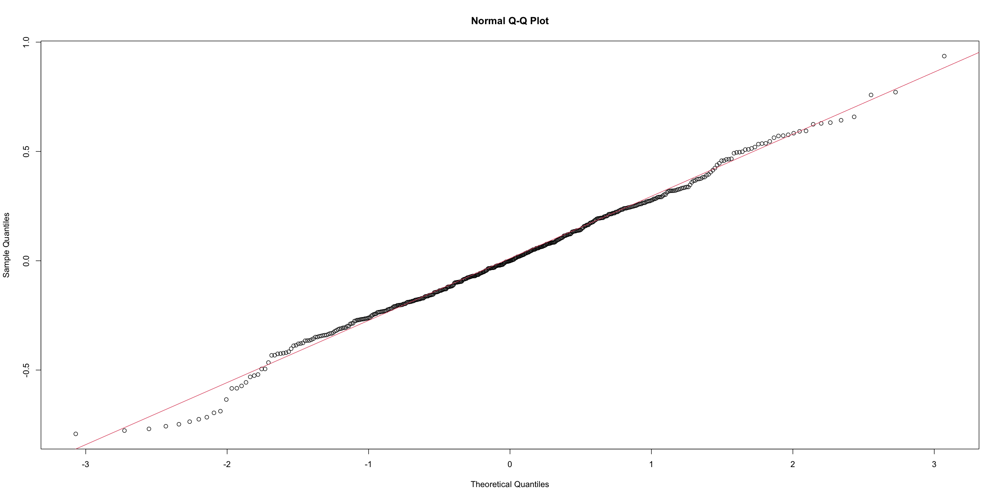

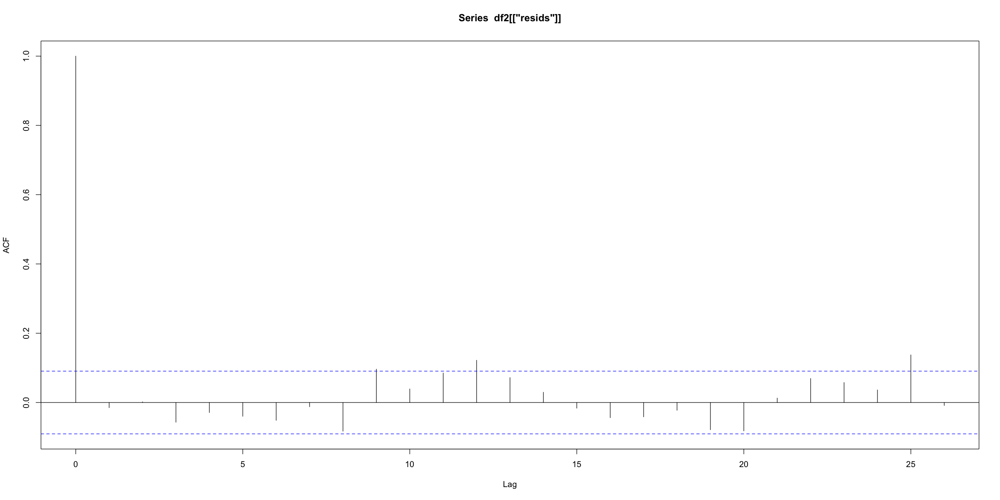

In [22]:
df2[['resids']] = arima_model$residuals

ggplot(df2, aes(x = index1, y = resids)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = 'Residuals Over Time',
    x = "Time",
    y = "Residuals"
  )

qqnorm(df2[['resids']])
qqline(df2[['resids']], col = 2)

acf(df2[['resids']])

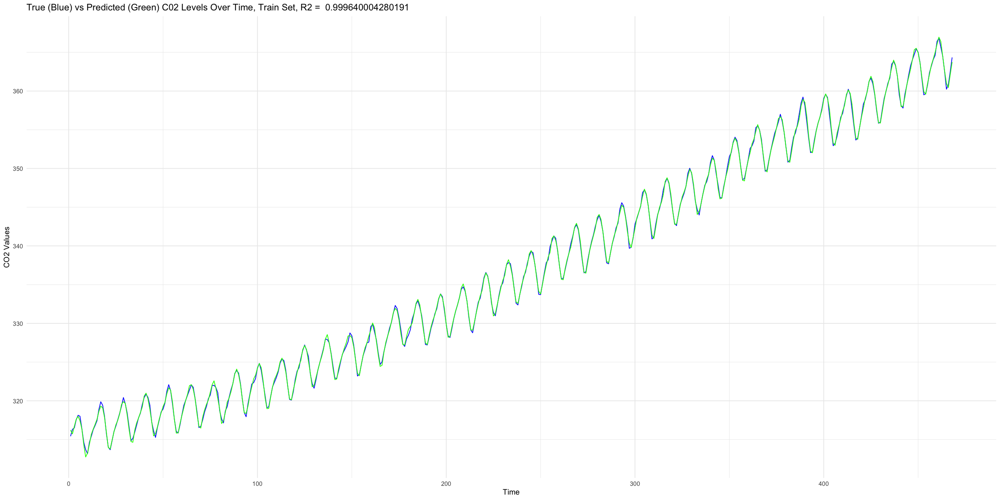

In [23]:
vals = (df2[['diff_value']] - df2[['resids']])+final_model$fitted.values
df2[['final_arima_preds']] = vals
train_r2 = 1 - sum((df2[['value']] - vals)**2) / (var(df2[['value']])*dim(df2)[1])

ggplot(df2) +
  geom_line(aes(x = index1, y = value),color = 'blue') +
  geom_line(aes(x = index1, y = final_arima_preds),color = 'green') +
  labs(
    title = paste('True (Blue) vs Predicted (Green) C02 Levels Over Time, Train Set, R2 = ',train_r2),
    x = "Time",
    y = "CO2 Values"
  )

### Forecast to 2022

In [24]:
start_year = 1998
end_year = 2023
start_index = 469
month_count = 1

rows = data.frame()
count = 1
while (start_year < end_year){
    row = c(year = start_year,
               index1 = start_index,
               index2 = start_index**2, 
               index3 = start_index**3,
               log_index = log(start_index),
               month = m_val[[paste(month_count)]])
    rows = append(rows,row)
    count = count + 1
    start_index = start_index + 1
    month_count = month_count + 1
    if (month_count >= 13){
        month_count = 1
        start_year = start_year + 1
    }
}

rows = data.frame(t(matrix(rows,nrow = 6)))
colnames(rows) = c('year','index1','index2','index3','log_index','month')

for (col in c('index1','index2','index3','log_index')) {
    rows[[col]] = as.numeric(rows[[col]])
}

for (col in c('year','month')) {
    rows[[col]] = as.character(rows[[col]])
}

rows[['preds']] = predict(final_model,rows)
rows[['arima_preds']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Point.Forecast']]
rows[['arima_lb']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Lo.95']]
rows[['arima_ub']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Hi.95']]

rows[['final_preds']] = rows[['preds']] + rows[['arima_preds']]

head(rows)

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1998,469,219961,103161709,6.150603,Jan,365.5456,-0.3005088,-0.8570648,0.2560472,365.2451
2,1998,470,220900,103823000,6.152733,Feb,366.3735,-0.2625260,-0.9519977,0.4269456,366.1110
3,1998,471,221841,104487111,6.154858,Mar,367.2731,-0.2546993,-1.0544652,0.5450665,367.0184
4,1998,472,222784,105154048,6.156979,Apr,368.5580,-0.2416257,-1.1249882,0.6417369,368.3164
5,1998,473,223729,105823817,6.159095,May,369.1892,-0.2305513,-1.1817281,0.7206254,368.9587
6,1998,474,224676,106496424,6.161207,Jun,368.6777,-0.2199236,-1.2268838,0.7870367,368.4578


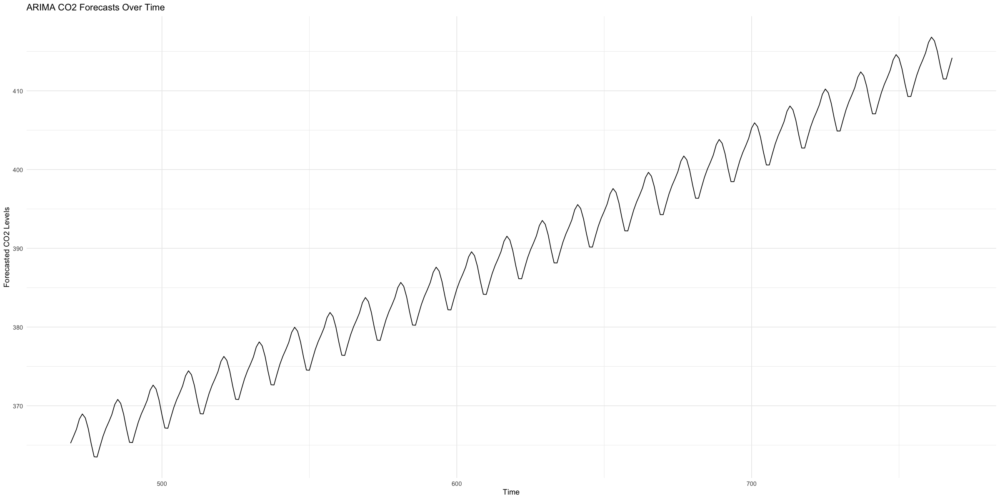

In [25]:
ggplot(rows, aes(x = index1, y = final_preds)) +
  geom_line() +

  labs(
    title = 'ARIMA CO2 Forecasts Over Time',
    x = "Time",
    y = "Forecasted CO2 Levels"
  )

$x
[1] "Time"

$y
[1] "ARIMA Forecasts"

$title
[1] "ARIMA Forecasts Over Time Without Trend Reconstruction, With LB/UB"

attr(,"class")
[1] "labels"

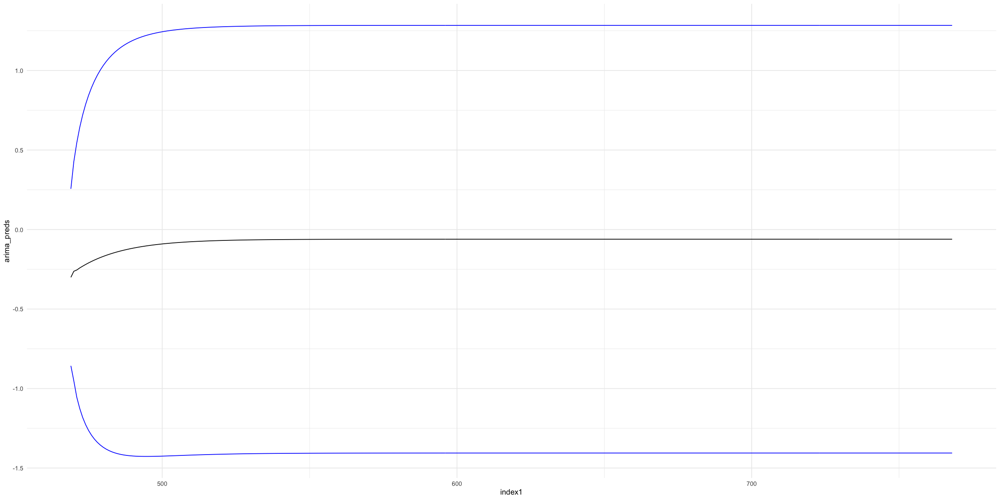

In [26]:
ggplot(rows) +
  geom_line(aes(x = index1, y = arima_preds)) + 
  geom_line(aes(x = index1, y = arima_lb), color = 'blue') +
  geom_line(aes(x = index1, y = arima_ub), color = 'blue')

  labs(
    title = 'ARIMA Forecasts Over Time Without Trend Reconstruction, With LB/UB',
    x = "Time",
    y = "ARIMA Forecasts"
  )

## (3 points) Task 4a: Forecast atmospheric CO2 growth 

Generate predictions for when atmospheric CO2 is expected to be at [420 ppm](https://research.noaa.gov/article/ArtMID/587/ArticleID/2764/Coronavirus-response-barely-slows-rising-carbon-dioxide) and 500 ppm levels for the first and final times (consider prediction intervals as well as point estimates in your answer). Generate a prediction for atmospheric CO2 levels in the year 2100. How confident are you that these will be accurate predictions?

In [27]:
start_year = 1998
end_year = 2101
start_index = 469
month_count = 1

rows = data.frame()
count = 1
while (start_year < end_year){
    row = c(year = start_year,
               index1 = start_index,
               index2 = start_index**2, 
               index3 = start_index**3,
               log_index = log(start_index),
               month = m_val[[paste(month_count)]])
    rows = append(rows,row)
    count = count + 1
    start_index = start_index + 1
    month_count = month_count + 1
    if (month_count >= 13){
        month_count = 1
        start_year = start_year + 1
    }
}

rows = data.frame(t(matrix(rows,nrow = 6)))
colnames(rows) = c('year','index1','index2','index3','log_index','month')

for (col in c('index1','index2','index3','log_index')) {
    rows[[col]] = as.numeric(rows[[col]])
}

for (col in c('year','month')) {
    rows[[col]] = as.character(rows[[col]])
}

rows[['preds']] = predict(final_model,rows)
rows[['arima_preds']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Point.Forecast']]
rows[['arima_lb']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Lo.95']]
rows[['arima_ub']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Hi.95']]

rows[['final_preds']] = rows[['preds']] + rows[['arima_preds']]

rows[['spot420']] = 420
rows[['spot500']] = 500

head(rows)

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,1998,469,219961,103161709,6.150603,Jan,365.5456,-0.3005088,-0.8570648,0.2560472,365.2451,420,500
2,1998,470,220900,103823000,6.152733,Feb,366.3735,-0.2625260,-0.9519977,0.4269456,366.1110,420,500
3,1998,471,221841,104487111,6.154858,Mar,367.2731,-0.2546993,-1.0544652,0.5450665,367.0184,420,500
4,1998,472,222784,105154048,6.156979,Apr,368.5580,-0.2416257,-1.1249882,0.6417369,368.3164,420,500
5,1998,473,223729,105823817,6.159095,May,369.1892,-0.2305513,-1.1817281,0.7206254,368.9587,420,500
6,1998,474,224676,106496424,6.161207,Jun,368.6777,-0.2199236,-1.2268838,0.7870367,368.4578,420,500


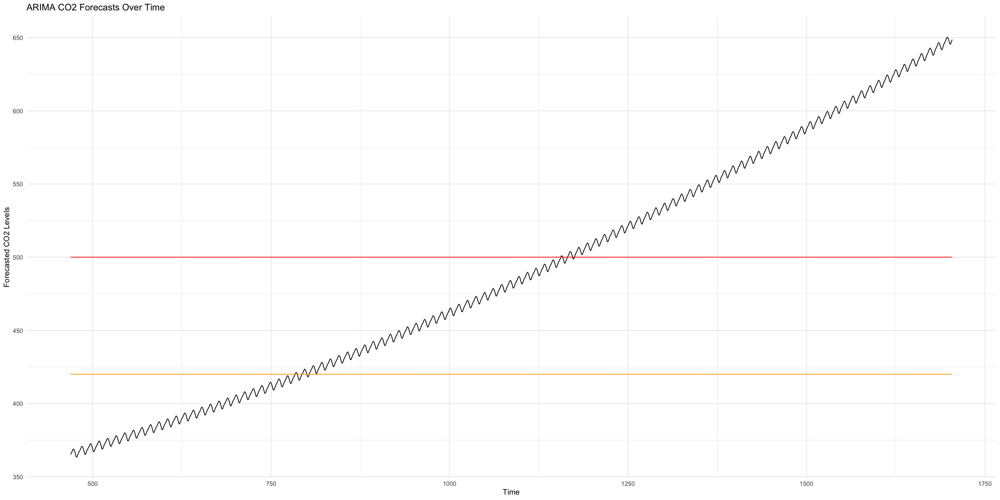

In [28]:
ggplot(rows) +
  geom_line(aes(x = index1, y = final_preds)) +
  geom_line(aes(x = index1, y = spot420), color = 'orange') + 
  geom_line(aes(x = index1, y = spot500), color = 'red') + 

  labs(
    title = 'ARIMA CO2 Forecasts Over Time',
    x = "Time",
    y = "Forecasted CO2 Levels"
  )

### First and Final Time at 420, April 2024 - Oct 2026

In [29]:
subset(rows,(final_preds > 419.5) & (final_preds < 421))

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
316,2024,784,614656,481890304,6.664409,Apr,420.6879,-0.06086248,-1.405697,1.283972,420.6271,420,500
318,2024,786,617796,485587656,6.666957,Jun,420.8940,-0.06086248,-1.405697,1.283972,420.8332,420,500
319,2024,787,619369,487443403,6.668228,Jul,419.5669,-0.06086248,-1.405697,1.283972,419.5061,420,500
325,2025,793,628849,498677257,6.675823,Jan,419.8142,-0.06086248,-1.405697,1.283972,419.7534,420,500
326,2025,794,630436,500566184,6.677083,Feb,420.6870,-0.06086248,-1.405697,1.283972,420.6261,420,500
332,2025,800,640000,512000000,6.684612,Aug,419.9724,-0.06086248,-1.405697,1.283972,419.9115,420,500
335,2025,803,644809,517781627,6.688355,Nov,419.7368,-0.06086248,-1.405697,1.283972,419.6760,420,500
336,2025,804,646416,519718464,6.689599,Dec,421.0476,-0.06086248,-1.405697,1.283972,420.9868,420,500
345,2026,813,660969,537367797,6.700731,Sep,420.6437,-0.06086248,-1.405697,1.283972,420.5828,420,500


### First and Final Time at 500, April 2055 - Nov 2056

In [30]:
subset(rows,(final_preds > 499.5) & (final_preds < 501))

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
688,2055,1156,1336336,1544804416,7.052721,Apr,500.3344,-0.06086248,-1.405697,1.283972,500.2736,420,500
689,2055,1157,1338649,1548816893,7.053586,May,501.0598,-0.06086248,-1.405697,1.283972,500.9989,420,500
690,2055,1158,1340964,1552836312,7.054450,Jun,500.6424,-0.06086248,-1.405697,1.283972,500.5815,420,500
697,2056,1165,1357225,1581167125,7.060476,Jan,499.9191,-0.06086248,-1.405697,1.283972,499.8582,420,500
698,2056,1166,1359556,1585242296,7.061334,Feb,500.8428,-0.06086248,-1.405697,1.283972,500.7819,420,500
704,2056,1172,1373584,1609840448,7.066467,Aug,500.4337,-0.06086248,-1.405697,1.283972,500.3729,420,500
707,2056,1175,1380625,1622234375,7.069023,Nov,500.3510,-0.06086248,-1.405697,1.283972,500.2901,420,500


# Report from the Point of View of the Present 

One of the very interesting features of Keeling and colleagues' research is that they were able to evaluate, and re-evaluate the data as new series of measurements were released. This permitted the evaluation of previous models' performance and a much more difficult question: If their models' predictions were "off" was this the result of a failure of the model, or a change in the system?  

## (1 point) Task 0b: Introduction [TODO]

In this introduction, you can assume that your reader will have **just** read your 1997 report. In this introduction, **very** briefly pose the question that you are evaluating, and describe what (if anything) has changed in the data generating process between 1997 and the present. 

## (3 points) Task 1b: Create a modern data pipeline for Mona Loa CO2 data.

The most current data is provided by the United States' National Oceanic and Atmospheric Administration, on a data page [[here](https://gml.noaa.gov/ccgg/trends/data.html)]. Gather the most recent weekly data from this page. (A group that is interested in even more data management might choose to work with the [hourly data](https://gml.noaa.gov/aftp/data/trace_gases/co2/in-situ/surface/mlo/co2_mlo_surface-insitu_1_ccgg_HourlyData.txt).)  

Create a data pipeline that starts by reading from the appropriate URL, and ends by saving an object called `co2_present` that is a suitable time series object.  

Conduct the same EDA on this data. Describe how the Keeling Curve evolved from 1997 to the present, noting where the series seems to be following similar trends to the series that you "evaluated in 1997" and where the series seems to be following different trends. This EDA can use the same, or very similar tools and views as you provided in your 1997 report. 

In [31]:
co2_present = read.table(url("https://gml.noaa.gov/webdata/ccgg/trends/co2/co2_daily_mlo.txt"))
colnames(co2_present) =  c('year','month_int','day','year_decimal','value')
co2_present[['month_int']] = co2_present[['month_int']]
head(co2_present)

current_rows = list()
start_index = subset(df,year == 1974 & month == 'May')[['index1']]

for (val in unique(co2_present[['year']])) {
    
    for (month in 1:12) {
        
        subset_df = subset(co2_present,(year == val) & (month_int == month))
        n_obs = dim(subset_df)[1]
        
        if (n_obs > 0) {
            
            avg_co2 = mean(subset_df[['value']])
            current_rows = append(current_rows, c(avg_co2,
                                  m_val[[month]],
                                  val,
                                  start_index,
                                  month
                                 )
                         )
            
            start_index = start_index + 1
            if (start_index == 204) {
                start_index = start_index + 1
            }
            
        }
        
    }
}

co2_present = data.frame(t(matrix(current_rows,nrow = 5)))
colnames(co2_present) = c('value','month','year','index1','month_int')
co2_present[['value']] = as.numeric(co2_present[['value']])
co2_present[['month']] = factor(as.character(co2_present[['month']]), 
                              levels = c('Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'))
co2_present[['year']] = as.numeric(co2_present[['year']])
co2_present[['index1']] = as.numeric(co2_present[['index1']])
co2_present[['month_int']] = as.numeric(co2_present[['month_int']])

for (num in 2:10) {
    co2_present[[paste('index',num,sep = '')]] = co2_present[['index1']]**num
}

co2_present[['log_index']] = log(co2_present[['index1']])
co2_present[['index']] = yearmonth(as.yearmon(paste(co2_present[['year']],co2_present[['month']]),"%Y %b"))

co2_present = as_tsibble(co2_present,index = index1, key = year)

head(co2_present)

,year,month_int,day,year_decimal,value
,<int>,<int>,<int>,<dbl>,<dbl>
1,1974,5,17,1974.374,333.38
2,1974,5,18,1974.377,333.11
3,1974,5,19,1974.380,333.46
4,1974,5,20,1974.382,333.64
5,1974,5,21,1974.385,333.50
6,1974,5,22,1974.388,333.21


value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,index
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<mth>
333.1569,May,1974,185,5,34225,6331625,1171350625,216699865625,4.008948e+13,7.416553e+15,1.372062e+18,2.538315e+20,4.695883e+22,5.220356,1974 May
332.1704,Jun,1974,186,6,34596,6434856,1196883216,222620278176,4.140737e+13,7.701771e+15,1.432529e+18,2.664505e+20,4.955979e+22,5.225747,1974 Jun
331.1100,Jul,1974,187,7,34969,6539203,1222830961,228669389707,4.276118e+13,7.996340e+15,1.495316e+18,2.796240e+20,5.228969e+22,5.231109,1974 Jul
329.1058,Aug,1974,188,8,35344,6644672,1249198336,234849287168,4.415167e+13,8.300513e+15,1.560496e+18,2.933733e+20,5.515419e+22,5.236442,1974 Aug
327.3032,Sep,1974,189,9,35721,6751269,1275989841,241162079949,4.557963e+13,8.614551e+15,1.628150e+18,3.077204e+20,5.815915e+22,5.241747,1974 Sep
327.3008,Oct,1974,190,10,36100,6859000,1303210000,247609900000,4.704588e+13,8.938717e+15,1.698356e+18,3.226877e+20,6.131066e+22,5.247024,1974 Oct


### CO2 Levels Over Time

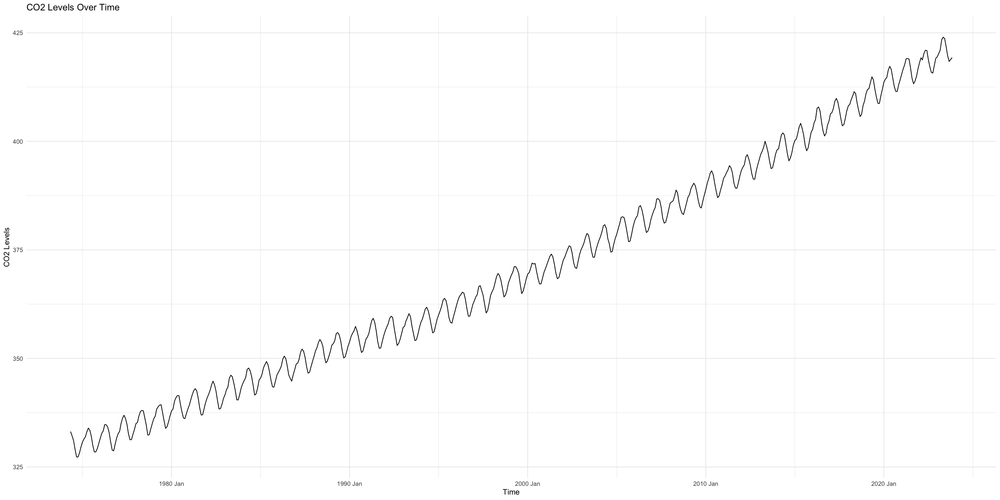

In [32]:
ggplot(co2_present, aes(x = index, y = value)) +
  geom_line() +
  labs(
    title = "CO2 Levels Over Time",
    x = "Time",
    y = "CO2 Levels"
  )

### Average/SD CO2 Level Per Year

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


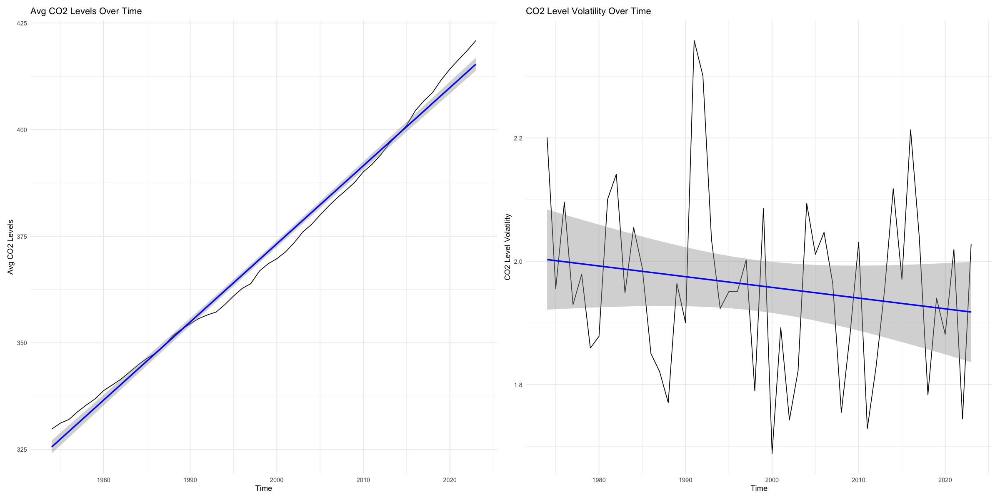

In [33]:
options(repr.plot.width = 20, repr.plot.height =10)

yrs = list()
means = list()
sds = list()

count = 1
for (yr in unique(co2_present[['year']])) {
    
    avg = mean(subset(co2_present,year == yr)[['value']])
    vol = sd(subset(co2_present,year == yr)[['value']])
    yrs[[count]] = yr
    means[[count]] = avg
    sds[[count]] = vol
    
    count = count + 1
    
}

annual_co2_present = data.frame(Index=1:length(yrs))
annual_co2_present[['Years']] = as.numeric(yrs)
annual_co2_present[['Avg_CO2']] = as.numeric(means)
annual_co2_present[['SD_CO2']] = as.numeric(sds)

p1 = ggplot(annual_co2_present, aes(x = Years, y = Avg_CO2)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = "Avg CO2 Levels Over Time",
    x = "Time",
    y = "Avg CO2 Levels"
  )

p2 = ggplot(annual_co2_present, aes(x = Years, y = SD_CO2)) +
  geom_line() +
  geom_smooth(method = "lm", color = "blue") +

  labs(
    title = "CO2 Level Volatility Over Time",
    x = "Time",
    y = "CO2 Level Volatility"
  )

p1 | p2

### Average/SD Monthly CO2 Levels

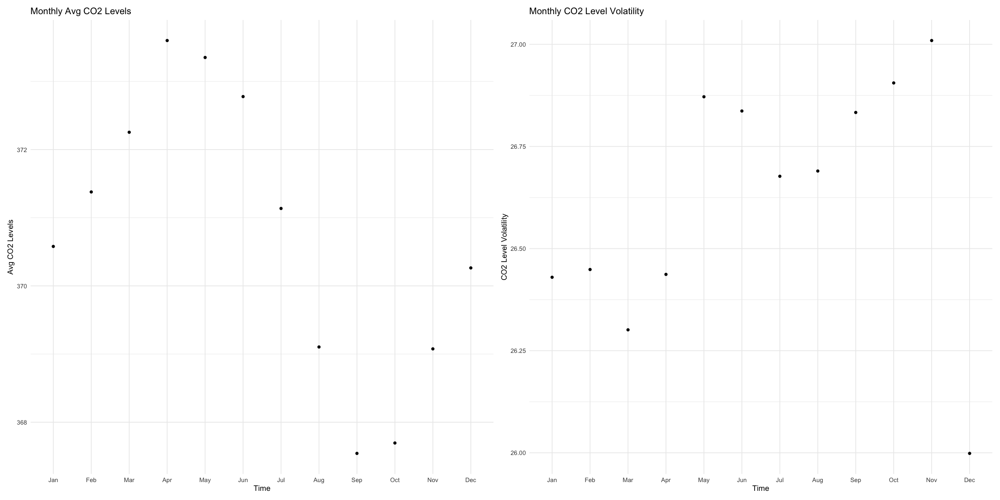

In [34]:
options(repr.plot.width = 20, repr.plot.height =10)

months = list()
means = list()
sds = list()

m_val = list('1'="Jan",
             '2'='Feb',
             '3'="Mar",
             '4'='Apr',
             '5'='May',
             '6'='Jun',
             '7'='Jul',
             '8'='Aug',
             '9'='Sep',
             '10'='Oct',
             '11'='Nov',
             '12'='Dec')
count = 1
for (val in unique(co2_present[['month_int']])) {
    
    avg = mean(subset(co2_present,month_int == val)[['value']])
    vol = sd(subset(co2_present,month_int == val)[['value']])
    months[[count]] = m_val[[paste(val)]]
    means[[count]] = avg
    sds[[count]] = vol
    
    count = count + 1
    
}

months_co2_present = data.frame(Index=1:length(months))
months_co2_present[['Month']] = factor(as.character(months), 
                              levels = c('Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'))
months_co2_present[['Avg_CO2']] = as.numeric(means)
months_co2_present[['SD_CO2']] = as.numeric(sds)

p1 = ggplot(months_co2_present, aes(x = Month, y = Avg_CO2)) +
  geom_point(stat = 'identity') +

  labs(
    title = "Monthly Avg CO2 Levels",
    x = "Time",
    y = "Avg CO2 Levels"
  )

p2 = ggplot(months_co2_present, aes(x = Month, y = SD_CO2)) +
  geom_point(stat = 'identity') +

  labs(
    title = "Monthly CO2 Level Volatility",
    x = "Time",
    y = "CO2 Level Volatility"
  )

p1 | p2

## (1 point) Task 2b: Compare linear model forecasts against realized CO2

Descriptively compare realized atmospheric CO2 levels to those predicted by your forecast from a linear time model in 1997 (i.e. "Task 2a"). (You do not need to run any formal tests for this task.) 

In [35]:
linear_preds = list()
arima_preds = list()
final_preds = list()

forecasted_df = subset(rows,year > 1997 & year < 2024)
co2_present_subset = subset(co2_present,year > 1997)

for (num in 1:dim(co2_present_subset)[1]){
    
    single_row = slice(co2_present_subset,num)
    year_val = single_row[['year']]
    month_val = single_row[['month']]
    
    forecast_row = subset(forecasted_df, year == year_val & month == month_val)
    linear_preds = append(linear_preds,forecast_row[['preds']])
    arima_preds = append(arima_preds,forecast_row[['arima_preds']])
    final_preds = append(final_preds,forecast_row[['final_preds']])   
}

co2_present_subset[['linear_preds']] = as.numeric(linear_preds)
co2_present_subset[['arima_preds']] = as.numeric(arima_preds)
co2_present_subset[['final_preds']] = as.numeric(final_preds)

head(co2_present_subset)

value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,index,linear_preds,arima_preds,final_preds
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<mth>,<dbl>,<dbl>,<dbl>
365.3837,Jan,1998,469,1,219961,103161709,48382841521,2.269155e+13,1.064234e+16,4.991257e+18,2.340899e+21,1.097882e+24,5.149066e+26,6.150603,1998 Jan,365.5456,-0.3005088,365.2451
366.1046,Feb,1998,470,2,220900,103823000,48796810000,2.293450e+13,1.077922e+16,5.066231e+18,2.381129e+21,1.119130e+24,5.259913e+26,6.152733,1998 Feb,366.3735,-0.2625260,366.1110
367.3635,Mar,1998,471,3,221841,104487111,49213429281,2.317953e+13,1.091756e+16,5.142169e+18,2.421962e+21,1.140744e+24,5.372904e+26,6.154858,1998 Mar,367.2731,-0.2546993,367.0184
368.7879,Apr,1998,472,4,222784,105154048,49632710656,2.342664e+13,1.105737e+16,5.219080e+18,2.463406e+21,1.162728e+24,5.488074e+26,6.156979,1998 Apr,368.5580,-0.2416257,368.3164
369.5573,May,1998,473,5,223729,105823817,50054665441,2.367586e+13,1.119868e+16,5.296976e+18,2.505470e+21,1.185087e+24,5.605462e+26,6.159095,1998 May,369.1892,-0.2305513,368.9587
369.1125,Jun,1998,474,6,224676,106496424,50479304976,2.392719e+13,1.134149e+16,5.375865e+18,2.548160e+21,1.207828e+24,5.725104e+26,6.161207,1998 Jun,368.6777,-0.2199236,368.4578


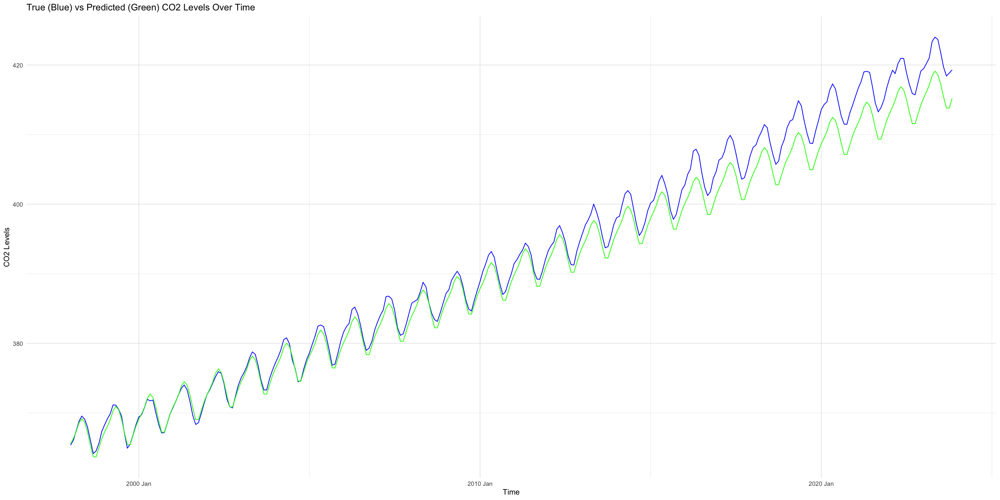

In [36]:
ggplot(co2_present_subset) +
  geom_line(aes(x = index, y = value),color = 'blue') +
  geom_line(aes(x = index, y = linear_preds),color = 'green') +


  labs(
    title = "True (Blue) vs Predicted (Green) CO2 Levels Over Time",
    x = "Time",
    y = "CO2 Levels"
  )

## (1 point) Task 3b: Compare ARIMA models forecasts against realized CO2  

Descriptively compare realized atmospheric CO2 levels to those predicted by your forecast from the ARIMA model that you fitted in 1997 (i.e. "Task 3a"). Describe how the Keeling Curve evolved from 1997 to the present. 

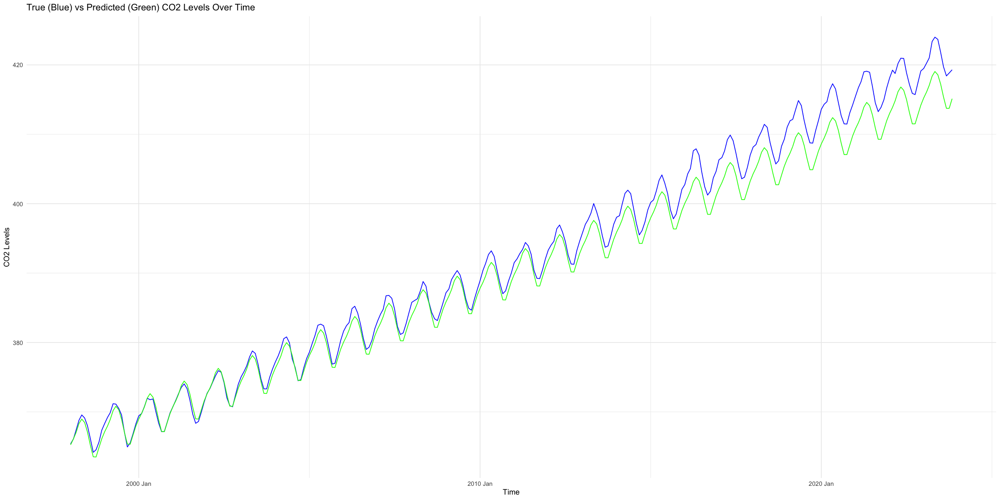

In [37]:
ggplot(co2_present_subset) +
  geom_line(aes(x = index, y = value),color = 'blue') +
  geom_line(aes(x = index, y = final_preds),color = 'green') +


  labs(
    title = "True (Blue) vs Predicted (Green) CO2 Levels Over Time",
    x = "Time",
    y = "CO2 Levels"
  )

## (3 points) Task 4b: Evaluate the performance of 1997 linear and ARIMA models 

In 1997 you made predictions about the first time that CO2 would cross 420 ppm. How close were your models to the truth? 

After reflecting on your performance on this threshold-prediction task, continue to use the weekly data to generate a month-average series from 1997 to the present, and compare the overall forecasting performance of your models from Parts 2a and 3b over the entire period. (You should conduct formal tests for this task.) 

### In 1997 you made predictions about the first time that CO2 would cross 420 ppm. How close were your models to the truth? 

Crossed in reality in April 2022 vs April 2024 (forecast). Off by 2 years

In [38]:
subset(co2_present_subset, value >= 419.5 & value < 420.5)

value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,index,linear_preds,arima_preds,final_preds
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<mth>,<dbl>,<dbl>,<dbl>
420.2043,Apr,2022,760,4,577600,438976000,333621760000,2.535525e+14,1.926999e+17,1.464519e+20,1.113035e+23,8.459064e+25,6.428889e+28,6.633318,2022 Apr,416.2009,-0.06086248,416.1400
420.2635,Feb,2023,770,2,592900,456533000,351530410000,2.706784e+14,2.084224e+17,1.604852e+20,1.235736e+23,9.515169e+25,7.326680e+28,6.646391,2023 Feb,416.1669,-0.06086248,416.1061
419.7210,Aug,2023,776,8,602176,467288576,362615934976,2.813900e+14,2.183586e+17,1.694463e+20,1.314903e+23,1.020365e+26,7.918031e+28,6.654153,2023 Aug,415.4325,-0.06086248,415.3717


### After reflecting on your performance on this threshold-prediction task, continue to use the weekly data to generate a month-average series from 1997 to the present, and compare the overall forecasting performance of your models from Parts 2a and 3b over the entire period. (You should conduct formal tests for this task.) 

(month average series already generated during initial data ingestion)

#### Linear Model Performance

[1] "R2 0.978729657845304"

[1] "RMSE 2.42100268344978"

[1] "MAE 1.86299853843154"

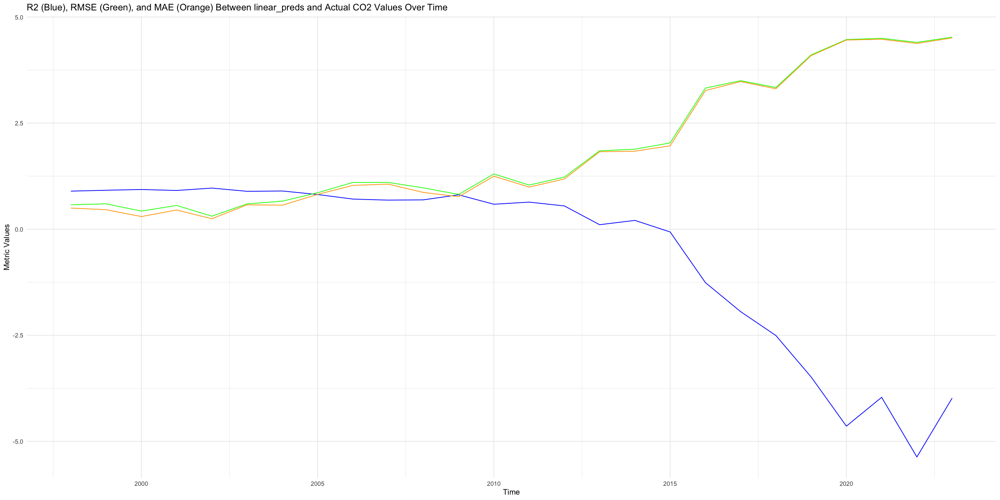

In [39]:
pred_col = 'linear_preds'

r2 = 1 - (sum((co2_present_subset[['value']] - co2_present_subset[[pred_col]])**2))/
(var(co2_present_subset[['value']])*dim(co2_present_subset)[1])

rmse = sqrt(mean((co2_present_subset[['value']] - co2_present_subset[[pred_col]])**2))
mae = mean(abs(co2_present_subset[['value']] - co2_present_subset[[pred_col]]))

paste('R2',r2)
paste('RMSE',rmse)
paste('MAE',mae)

performance_over_time = list()

for (year_val in unique(co2_present_subset[['year']])) {
    
    subset_df = subset(co2_present_subset,year == year_val)
    r2 = 1 - (sum((subset_df[['value']] - subset_df[[pred_col]])**2))/
    (var(subset_df[['value']])*dim(subset_df)[1])

    rmse = sqrt(mean((subset_df[['value']] - subset_df[[pred_col]])**2))
    mae = mean(abs(subset_df[['value']] - subset_df[[pred_col]]))
    
    performance_over_time = append(performance_over_time,c(year_val,r2,rmse,mae))
    
}

performance_over_time = data.frame(t(matrix(performance_over_time,nrow = 4)))
colnames(performance_over_time) = c('Year','R2','RMSE','MAE')

for (col in colnames(performance_over_time)){
    
    performance_over_time[[col]] = as.numeric(performance_over_time[[col]])
    
}

ggplot(performance_over_time) +
  geom_line(aes(x = Year, y = R2),color = 'blue') +
  geom_line(aes(x = Year, y = RMSE),color = 'green') +
  geom_line(aes(x = Year, y = MAE),color = 'orange') +

  labs(
    title = paste("R2 (Blue), RMSE (Green), and MAE (Orange) Between",pred_col,'and Actual CO2 Values Over Time'),
    x = "Time",
    y = "Metric Values"
  )

#### ARIMA Model Performance

[1] "R2 0.977898144754548"

[1] "RMSE 2.46787067778632"

[1] "MAE 1.91661235931732"

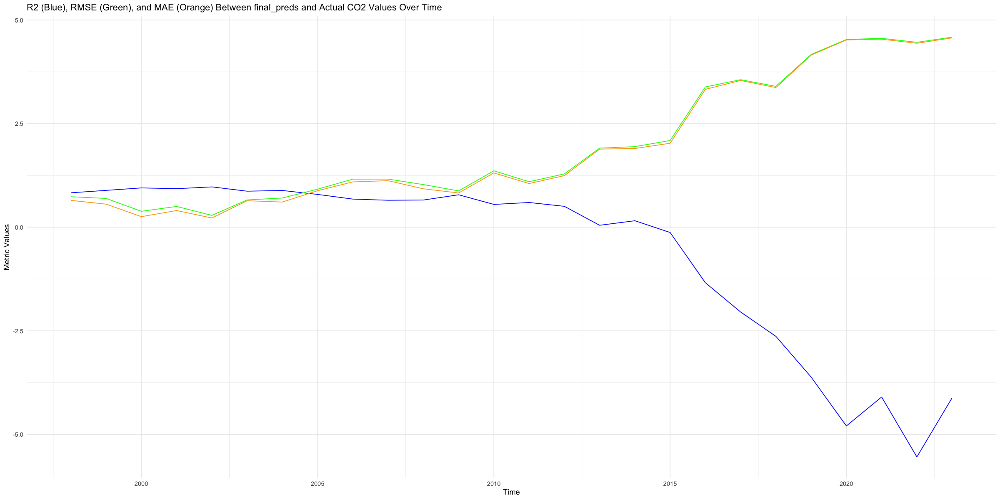

In [40]:
pred_col = 'final_preds'

r2 = 1 - (sum((co2_present_subset[['value']] - co2_present_subset[[pred_col]])**2))/
(var(co2_present_subset[['value']])*dim(co2_present_subset)[1])

rmse = sqrt(mean((co2_present_subset[['value']] - co2_present_subset[[pred_col]])**2))
mae = mean(abs(co2_present_subset[['value']] - co2_present_subset[[pred_col]]))

paste('R2',r2)
paste('RMSE',rmse)
paste('MAE',mae)

performance_over_time = list()

for (year_val in unique(co2_present_subset[['year']])) {
    
    subset_df = subset(co2_present_subset,year == year_val)
    r2 = 1 - (sum((subset_df[['value']] - subset_df[[pred_col]])**2))/
    (var(subset_df[['value']])*dim(subset_df)[1])

    rmse = sqrt(mean((subset_df[['value']] - subset_df[[pred_col]])**2))
    mae = mean(abs(subset_df[['value']] - subset_df[[pred_col]]))
    
    performance_over_time = append(performance_over_time,c(year_val,r2,rmse,mae))
    
}

performance_over_time = data.frame(t(matrix(performance_over_time,nrow = 4)))
colnames(performance_over_time) = c('Year','R2','RMSE','MAE')

for (col in colnames(performance_over_time)){
    
    performance_over_time[[col]] = as.numeric(performance_over_time[[col]])
    
}

ggplot(performance_over_time) +
  geom_line(aes(x = Year, y = R2),color = 'blue') +
  geom_line(aes(x = Year, y = RMSE),color = 'green') +
  geom_line(aes(x = Year, y = MAE),color = 'orange') +

  labs(
    title = paste("R2 (Blue), RMSE (Green), and MAE (Orange) Between",pred_col,'and Actual CO2 Values Over Time'),
    x = "Time",
    y = "Metric Values"
  )

## (4 points) Task 5b: Train best models on present data

Seasonally adjust the weekly NOAA data, and split both seasonally-adjusted (SA) and non-seasonally-adjusted (NSA) series into training and test sets, using the last two years of observations as the test sets. For both SA and NSA series, fit ARIMA models using all appropriate steps. Measure and discuss how your models perform in-sample and (psuedo-) out-of-sample, comparing candidate models and explaining your choice. In addition, fit a polynomial time-trend model to the seasonally-adjusted series and compare its performance to that of your ARIMA model.

### Seasonal and Non seasonally adjusted Data, Split Into Train and Test

In [41]:
nsa = co2_present
nsa[['diff_value']] = c(c(0),diff(nsa[['value']]))
nsa = slice(nsa,2:dim(nsa)[1])

head(nsa)

sa = co2_present
sa[['diff_value']] = sa[['value']] - lag(sa[['value']],12)
sa[['diff_value2']] = sa[['diff_value']] - lag(sa[['diff_value']],1)
sa = na.omit(sa)

head(sa)

nsa_train = subset(nsa,year < 2022)
nsa_test = subset(nsa, year >= 2022)

sa_train = subset(sa,year < 2022)
sa_test = subset(sa, year >= 2022)

value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,index,diff_value
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<mth>,<dbl>
332.1704,Jun,1974,186,6,34596,6434856,1196883216,222620278176,4.140737e+13,7.701771e+15,1.432529e+18,2.664505e+20,4.955979e+22,5.225747,1974 Jun,-0.986523077
331.1100,Jul,1974,187,7,34969,6539203,1222830961,228669389707,4.276118e+13,7.996340e+15,1.495316e+18,2.796240e+20,5.228969e+22,5.231109,1974 Jul,-1.060400000
329.1058,Aug,1974,188,8,35344,6644672,1249198336,234849287168,4.415167e+13,8.300513e+15,1.560496e+18,2.933733e+20,5.515419e+22,5.236442,1974 Aug,-2.004230769
327.3032,Sep,1974,189,9,35721,6751269,1275989841,241162079949,4.557963e+13,8.614551e+15,1.628150e+18,3.077204e+20,5.815915e+22,5.241747,1974 Sep,-1.802587413
327.3008,Oct,1974,190,10,36100,6859000,1303210000,247609900000,4.704588e+13,8.938717e+15,1.698356e+18,3.226877e+20,6.131066e+22,5.247024,1974 Oct,-0.002348485
328.2735,Nov,1974,191,11,36481,6967871,1330863361,254194901951,4.855123e+13,9.273284e+15,1.771197e+18,3.382987e+20,6.461505e+22,5.252273,1974 Nov,0.972628205


value,month,year,index1,month_int,index2,index3,index4,index5,index6,index7,index8,index9,index10,log_index,index,diff_value,diff_value2
<dbl>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<mth>,<dbl>,<dbl>
333.4559,Jun,1975,198,6,39204,7762392,1536953616,304316815968,6.025473e+13,1.193044e+16,2.362226e+18,4.677208e+20,9.260872e+22,5.288267,1975 Jun,1.2855259,0.49459186
332.0375,Jul,1975,199,7,39601,7880599,1568239201,312079600999,6.210384e+13,1.235866e+16,2.459374e+18,4.894155e+20,9.739368e+22,5.293305,1975 Jul,0.9275000,-0.35802593
329.9175,Aug,1975,200,8,40000,8000000,1600000000,320000000000,6.400000e+13,1.280000e+16,2.560000e+18,5.120000e+20,1.024000e+23,5.298317,1975 Aug,0.8117308,-0.11576923
328.4582,Sep,1975,201,9,40401,8120601,1632240801,328080401001,6.594416e+13,1.325478e+16,2.664210e+18,5.355062e+20,1.076367e+23,5.303305,1975 Sep,1.1550000,0.34326923
328.4755,Oct,1975,202,10,40804,8242408,1664966416,336323216032,6.793729e+13,1.372333e+16,2.772113e+18,5.599669e+20,1.131133e+23,5.308268,1975 Oct,1.1746212,0.01962121
329.2300,Nov,1975,203,11,41209,8365427,1698181681,344730881243,6.998037e+13,1.420601e+16,2.883821e+18,5.854157e+20,1.188394e+23,5.313206,1975 Nov,0.9565385,-0.21808275


### Inspect Stationarity of Adjusted Series

`geom_smooth()` using formula = 'y ~ x'


$x
[1] "Time"

$y
[1] "Target Variable"

$title
[1] "NSA Target Variable Over Time"

attr(,"class")
[1] "labels"

`geom_smooth()` using formula = 'y ~ x'


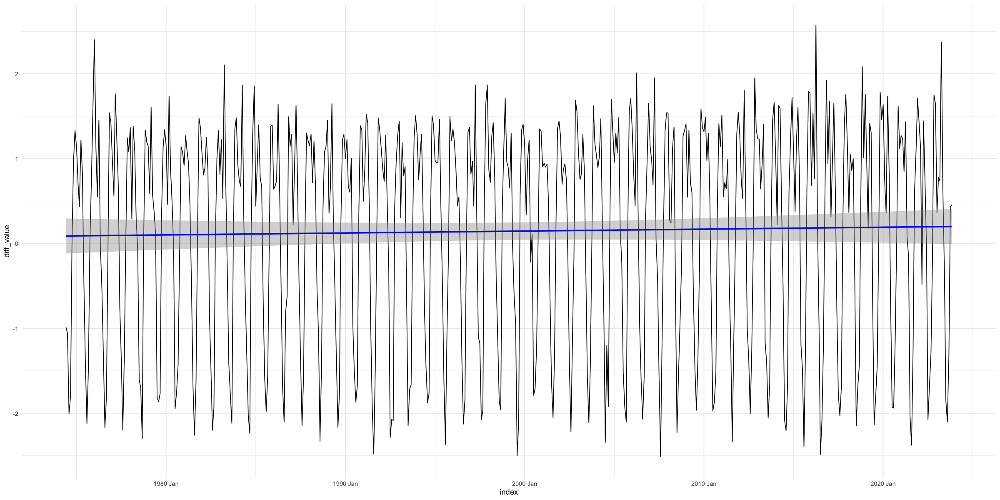

$x
[1] "Time"

$y
[1] "Target Variable"

$title
[1] "SA Target Variable Over Time"

attr(,"class")
[1] "labels"

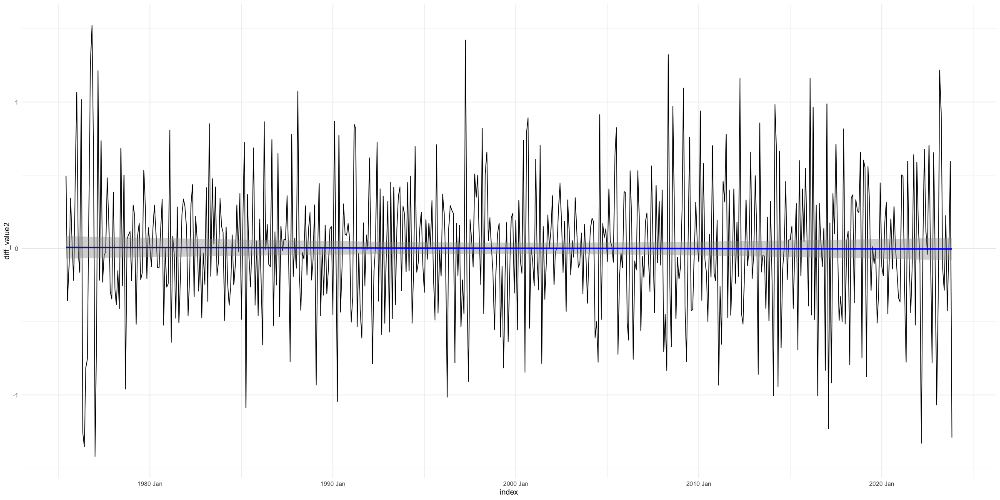

In [42]:
ggplot(nsa,aes(x = index, y = diff_value)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("NSA Target Variable Over Time"),
    x = "Time",
    y = "Target Variable"
  )

ggplot(sa,aes(x = index, y = diff_value2)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("SA Target Variable Over Time"),
    x = "Time",
    y = "Target Variable"
  )

### ACF/PACF of NSA Series

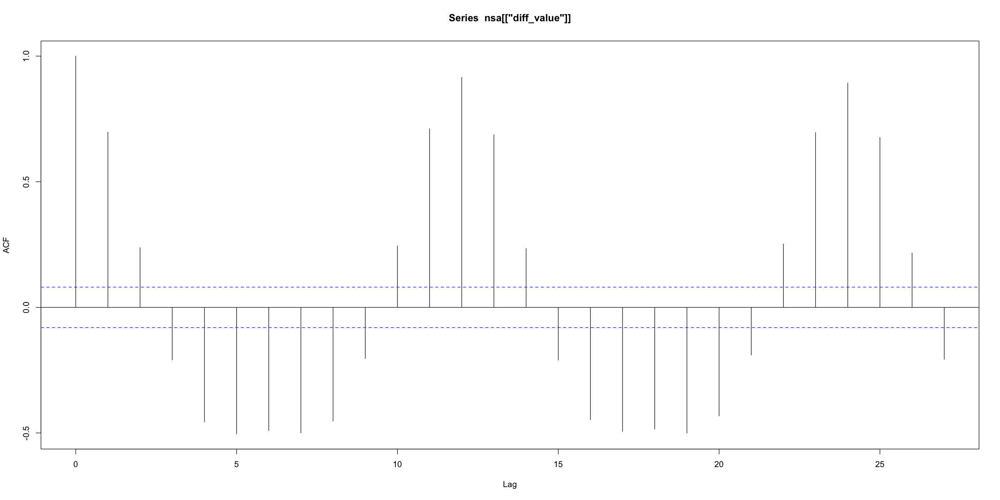

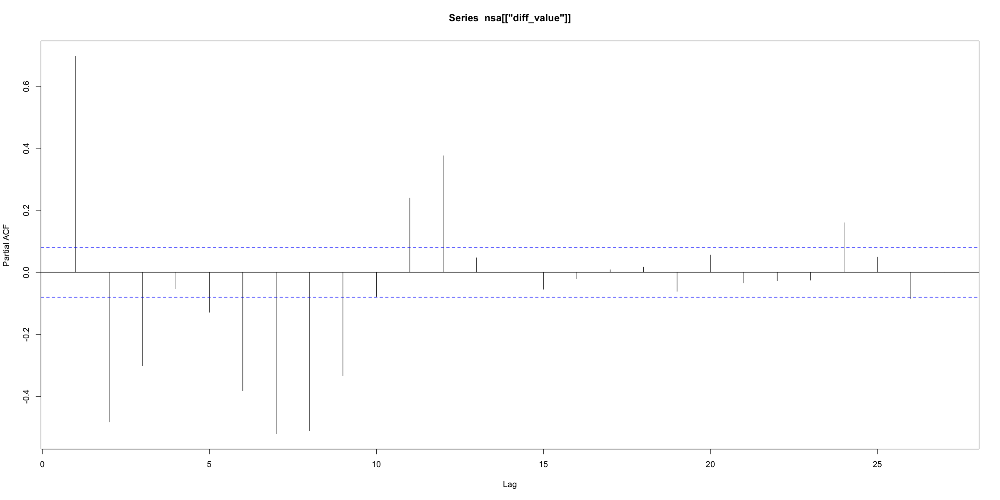

In [43]:
acf(nsa[['diff_value']])
pacf(nsa[['diff_value']])

### ACF/PACF of SA Series

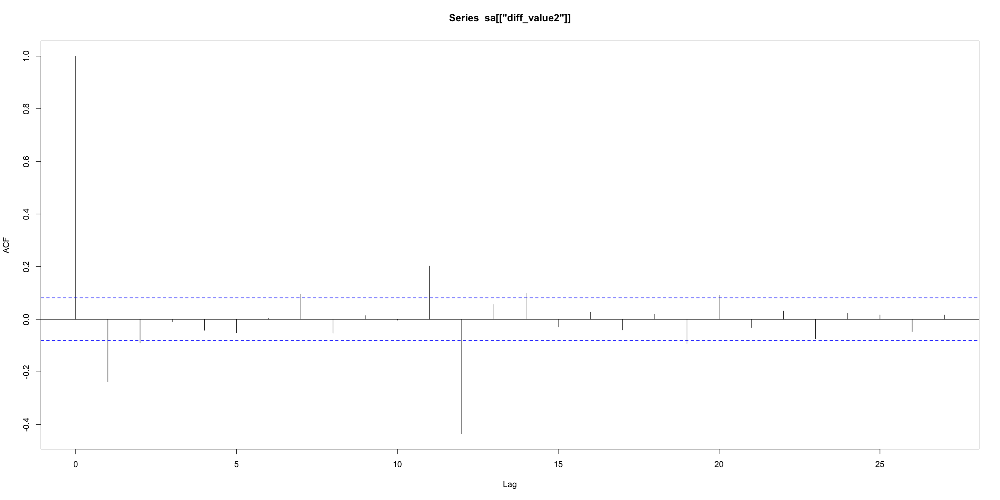

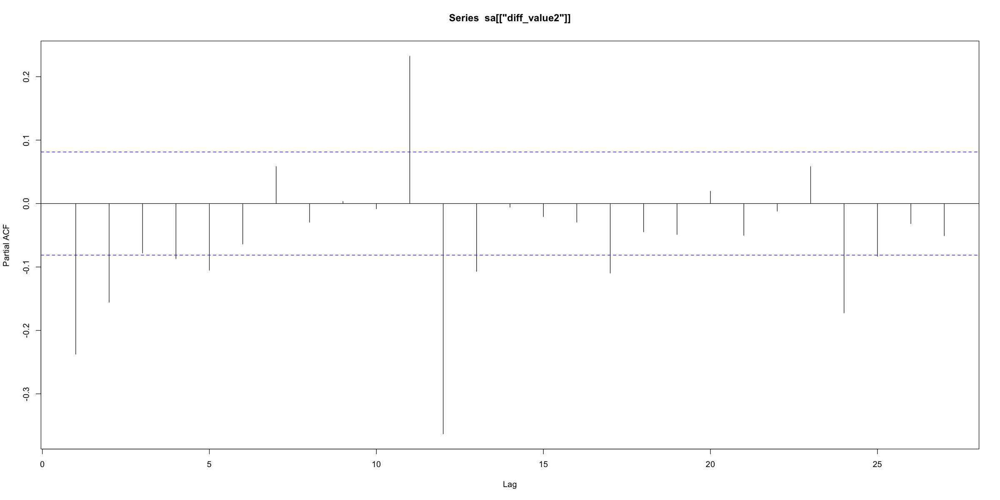

In [44]:
acf(sa[['diff_value2']])
pacf(sa[['diff_value2']])

### For both SA and NSA series, fit ARIMA models using all appropriate steps. Measure and discuss how your models perform in-sample and (psuedo-) out-of-sample, comparing candidate models and explaining your choice

In [45]:
nsarows = list()

for (p in 1:12){
    
    for (q in 0:4) {
        
        suppressWarnings({model = arima(nsa_train[['diff_value']], order=c(p,0,q))})
        
        preds = data.frame(forecast(model,h=dim(nsa_test)[1]))[['Point.Forecast']]
        preds = nsa_train[['value']][dim(nsa_train)[1]] + cumsum(preds)
        true = nsa_test[['value']]
        
        r2 = 1 - sum((true - preds)**2) / (var(true)*length(true))
        rmse = sqrt(mean((true-preds)**2))
        mae = mean(abs(true-preds))
        
        suppressWarnings({
            nsarows = append(nsarows,c(p,q,BIC(model),r2,rmse,mae))
            
            })
    }
}

nsarows = data.frame(t(matrix(nsarows,nrow = 6)))
colnames(nsarows) = c('P','Q','BICVal','R2','RMSE','MAE')

for (col in colnames(nsarows)) {
    
    nsarows[[col]] = as.numeric(nsarows[[col]])
    
}

nsarows

P,Q,BICVal,R2,RMSE,MAE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,1527.5931,-0.97834391,3.0954951,2.4251596
1,1,1453.3522,-0.36913715,2.5751510,2.0742742
1,2,1411.5042,-0.13096964,2.3404787,1.9018083
1,3,1384.4701,0.02961154,2.1679639,1.8005937
1,4,1297.9200,-0.26605341,2.4763113,1.9876468
2,0,1375.3858,0.11575953,2.0694952,1.6936332
2,1,1182.8804,0.08914323,2.1004109,1.5971389
2,2,1343.4675,-0.22730027,2.4381175,2.0162881
2,3,1314.1668,-0.23047901,2.4412729,1.9930117


In [46]:
sarows = list()

for (p in 1:12){
    
    for (q in 0:4) {
        
        
        suppressWarnings({model = arima(sa_train[['diff_value2']], order=c(p,0,q))})
        
        preds = data.frame(forecast(model,h=dim(sa_test)[1]))[['Point.Forecast']]
        preds = sa_train[['diff_value']][dim(sa_train)[1]] + cumsum(preds)
        preds = preds + c(slice(data.frame(lag(co2_present[['value']],12))
                                ,(dim(co2_present)[1] - dim(sa_test)[1] + 1):(dim(co2_present)[1])))$lag.co2_present...value.....12.
        true = sa_test[['value']]
        
        r2 = 1 - sum((true - preds)**2) / (var(true)*length(true))
        rmse = sqrt(mean((true-preds)**2))
        mae = mean(abs(true-preds))
        
        suppressWarnings({
            sarows = append(sarows,c(p,q,BIC(model),r2,rmse,mae))
            
            })
    }
}

sarows = data.frame(t(matrix(sarows,nrow = 6)))
colnames(sarows) = c('P','Q','BICVal','R2','RMSE','MAE')

for (col in colnames(sarows)) {
    
    sarows[[col]] = as.numeric(sarows[[col]])
    
}

sarows

P,Q,BICVal,R2,RMSE,MAE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,694.8662,0.9189210,0.6266621,0.5095384
1,1,681.0528,0.9216150,0.6161631,0.5153097
1,2,658.3960,0.9140214,0.6453188,0.4981918
1,3,664.5380,0.9143425,0.6441128,0.4973249
1,4,670.8551,0.9143085,0.6442406,0.4976015
2,0,691.2831,0.9192217,0.6254991,0.5096159
2,1,659.5817,0.9131697,0.6485071,0.4993198
2,2,664.5423,0.9145107,0.6434799,0.4973321
2,3,649.1193,0.9115327,0.6545917,0.5012402


### In addition, fit a polynomial time-trend model to the seasonally-adjusted series and compare its performance to that of your ARIMA model.

In [47]:
model = lm(diff_value2 ~ index1 + index2 + log_index + month,data = sa_train)
summary(model)
BIC(model)

preds = predict(model,sa_test)
preds = sa_train[['diff_value']][dim(sa_train)[1]] + cumsum(preds)
preds = preds + c(slice(data.frame(lag(co2_present[['value']],12))
                        ,(dim(co2_present)[1] - dim(sa_test)[1] + 1):(dim(co2_present)[1])))$lag.co2_present...value.....12.
true = sa_test[['value']]

r2 = 1 - sum((true - preds)**2) / (var(true)*length(true))
rmse = sqrt(mean((true-preds)**2))
mae = mean(abs(true-preds))

print(r2)
print(rmse)
print(mae)


Call:
lm(formula = diff_value2 ~ index1 + index2 + log_index + month, 
    data = sa_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.43426 -0.27223 -0.01941  0.28484  1.48814 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)
(Intercept)  1.734e+00  6.558e+00   0.264    0.792
index1       1.722e-03  6.954e-03   0.248    0.804
index2      -9.100e-07  3.872e-06  -0.235    0.814
log_index   -3.812e-01  1.457e+00  -0.262    0.794
monthFeb     3.404e-03  9.683e-02   0.035    0.972
monthMar     4.439e-03  9.683e-02   0.046    0.963
monthApr     2.323e-02  9.683e-02   0.240    0.810
monthMay    -2.301e-02  9.683e-02  -0.238    0.812
monthJun    -9.151e-03  9.632e-02  -0.095    0.924
monthJul    -3.933e-02  9.631e-02  -0.408    0.683
monthAug    -2.157e-02  9.631e-02  -0.224    0.823
monthSep     2.695e-02  9.631e-02   0.280    0.780
monthOct     4.598e-02  9.631e-02   0.477    0.633
monthNov     1.979e-02  9.632e-02   0.205    0.837
monthDec     2.278e-02 

[1] 813.4335

[1] 0.9097832
[1] 0.6610326
[1] 0.5415748


### Retry Modeling Seasonally Adjusted Series Using Linear Model to Seasonal Adjust

In [48]:
sa = co2_present

sa_train = subset(sa,year < 2022)
sa_test = subset(sa, year >= 2022)

model = lm(value ~ index1 + index2 + log_index + month,data = sa_train)
sa_train[['preds']] = model$fitted.values
sa_train[['diff_value']] = model$residuals

sa_test[['preds']] = predict(model,sa_test)
sa_test[['diff_value']] = sa_test[['value']] - sa_test[['preds']]

`geom_smooth()` using formula = 'y ~ x'


$x
[1] "Time"

$y
[1] "Target Variable"

$title
[1] "SA Target Variable Over Time"

attr(,"class")
[1] "labels"

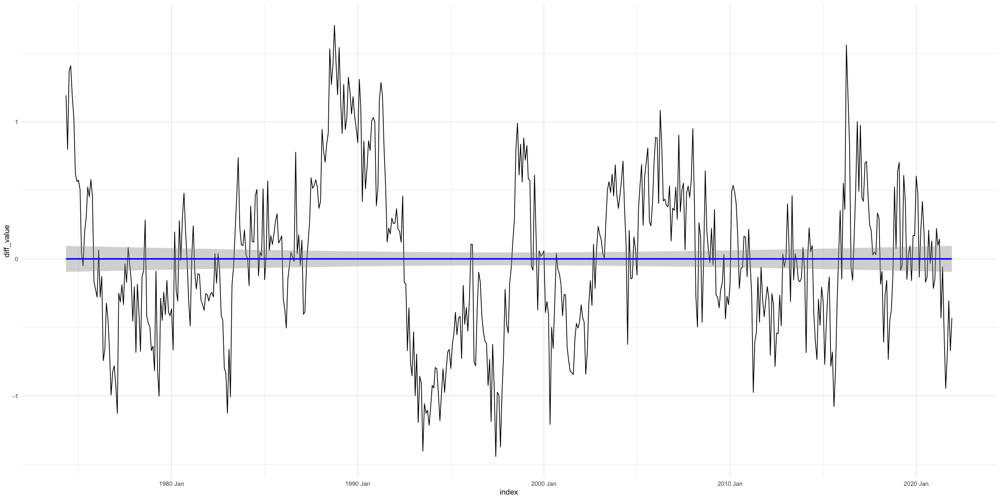

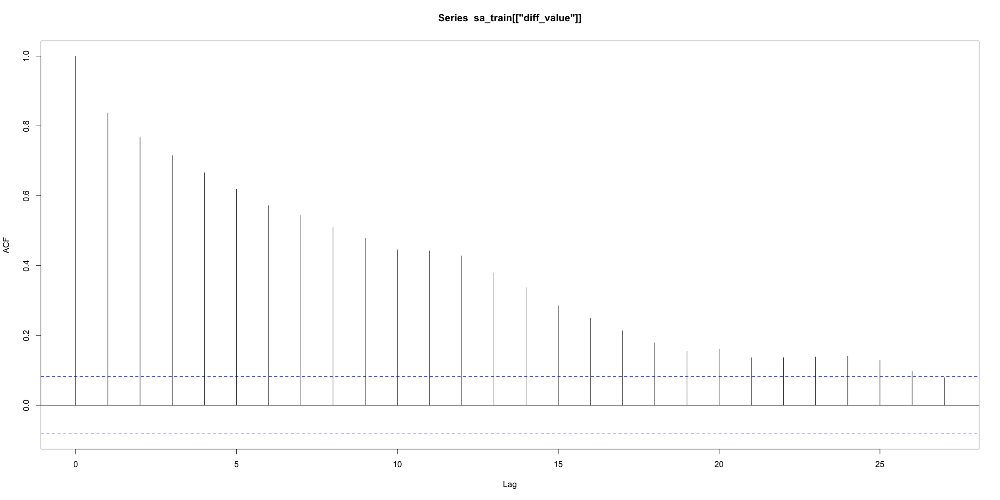

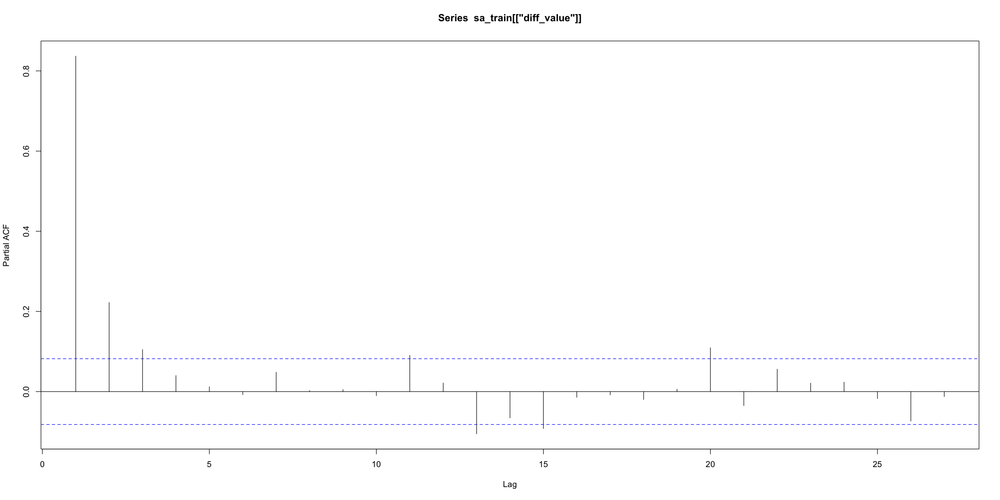

In [49]:
ggplot(sa_train,aes(x = index, y = diff_value)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("SA Target Variable Over Time"),
    x = "Time",
    y = "Target Variable"
  )

acf(sa_train[['diff_value']])
pacf(sa_train[['diff_value']])

In [50]:
sarows = list()

for (p in 1:12){
    
    for (q in 0:4) {
        
        
        suppressWarnings({model = arima(sa_train[['diff_value']], order=c(p,0,q))})
        
        preds = data.frame(forecast(model,h=dim(sa_test)[1]))[['Point.Forecast']]
        preds = sa_test[['preds']] + preds
        true = sa_test[['value']]
        
        r2 = 1 - sum((true - preds)**2) / (var(true)*length(true))
        rmse = sqrt(mean((true-preds)**2))
        mae = mean(abs(true-preds))
        
        suppressWarnings({
            sarows = append(sarows,c(p,q,BIC(model),r2,rmse,mae))
            
            })
    }
}

sarows = data.frame(t(matrix(sarows,nrow = 6)))
colnames(sarows) = c('P','Q','BICVal','R2','RMSE','MAE')

for (col in colnames(sarows)) {
    
    sarows[[col]] = as.numeric(sarows[[col]])
    
}

sarows

P,Q,BICVal,R2,RMSE,MAE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,311.7253,0.7480136,1.1047596,1.0252482
1,1,279.9799,0.7954636,0.9953242,0.9172580
1,2,284.5625,0.8037541,0.9749437,0.8965078
1,3,290.9084,0.8035357,0.9754860,0.8970392
1,4,297.2551,0.8032860,0.9761056,0.8976563
2,0,288.1013,0.7763396,1.0408156,0.9632191
2,1,284.6010,0.8052222,0.9712902,0.8929139
2,2,290.9105,0.8035025,0.9755683,0.8971195
2,3,297.2358,0.8027486,0.9774381,0.8989451


#### Fit Polynomial to Seasonally Adjusted Data

In [51]:
model = lm(diff_value~index1 + index2 + log_index + month,sa_train)

summary(model)


Call:
lm(formula = diff_value ~ index1 + index2 + log_index + month, 
    data = sa_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-1.44248 -0.39093 -0.03597  0.40174  1.70541 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)
(Intercept)  8.513e-15  7.033e+00       0        1
index1       1.499e-17  7.707e-03       0        1
index2      -1.129e-20  4.377e-06       0        1
log_index   -2.102e-15  1.573e+00       0        1
monthFeb    -1.697e-16  1.205e-01       0        1
monthMar    -4.642e-16  1.205e-01       0        1
monthApr    -1.707e-16  1.205e-01       0        1
monthMay    -1.045e-16  1.199e-01       0        1
monthJun     1.054e-16  1.199e-01       0        1
monthJul     3.509e-17  1.199e-01       0        1
monthAug    -7.926e-17  1.199e-01       0        1
monthSep    -1.459e-17  1.199e-01       0        1
monthOct     1.894e-17  1.199e-01       0        1
monthNov    -2.704e-17  1.199e-01       0        1
monthDec     2.658e-19  

#### Final Arima Model, Use Linear Model Differencing Because it allows us to reconstruct forecasts farther out into the future even when arima model begins generating constant predictions

In [52]:
final_arima = arima(sa_train[['diff_value']], order=c(1,0,1))
summary(final_arima)
1 - (sum(final_arima$residuals**2) / (var(sa_train[['diff_value']]) * dim(sa_train)[1]))


Call:
arima(x = sa_train[["diff_value"]], order = c(1, 0, 1))

Coefficients:
         ar1      ma1  intercept
      0.9318  -0.3305     0.0136
s.e.  0.0181   0.0490     0.1214

sigma^2 estimated as 0.09122:  log likelihood = -127.3,  aic = 262.59

Training set error measures:
                       ME      RMSE       MAE      MPE    MAPE      MASE
Training set -0.004286329 0.3020277 0.2343939 235.9464 341.182 0.9224126
                   ACF1
Training set 0.01069848

[1] 0.7259469

#### Evaluate Residuals

In [53]:
sa_train[['arima_resids']] = final_arima$residuals

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
`geom_smooth()` using formula = 'y ~ x'


$x
[1] "Time"

$y
[1] "Residuals"

$title
[1] "ARIMA Model Residuals Over Time"

attr(,"class")
[1] "labels"

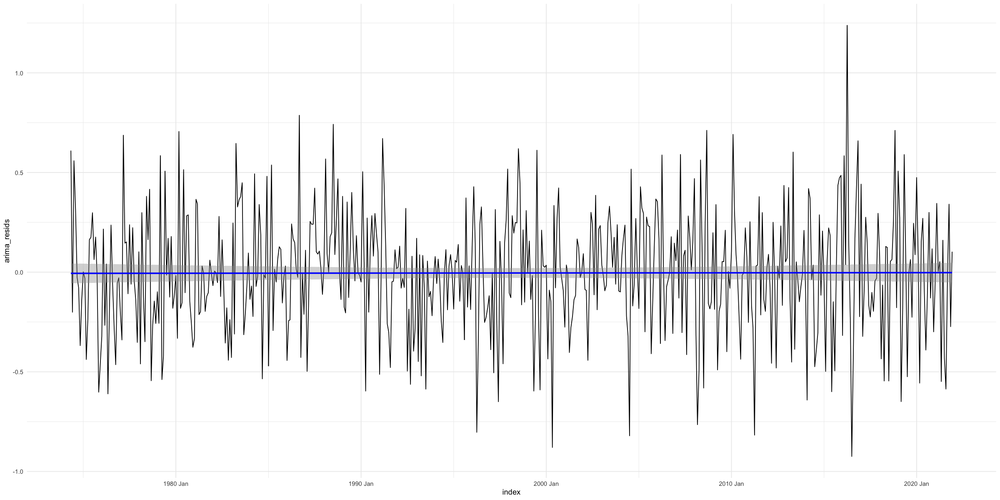

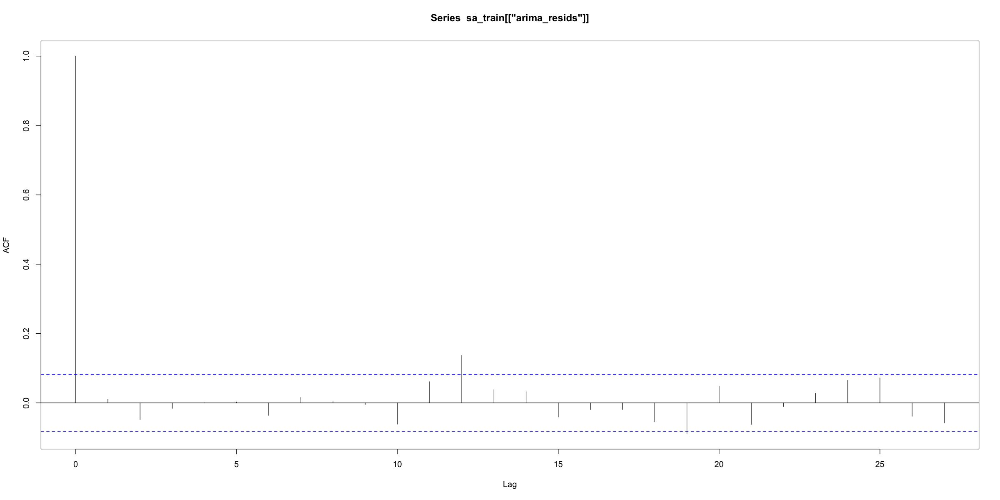

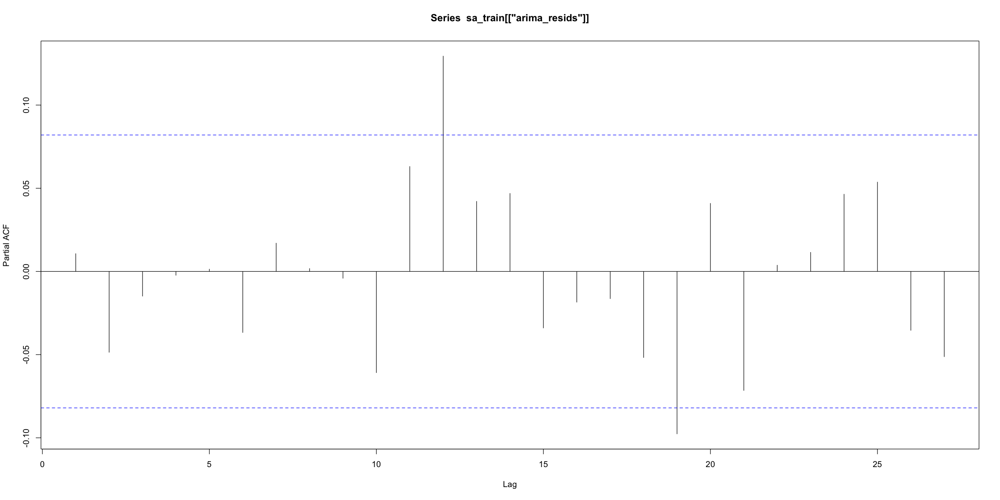

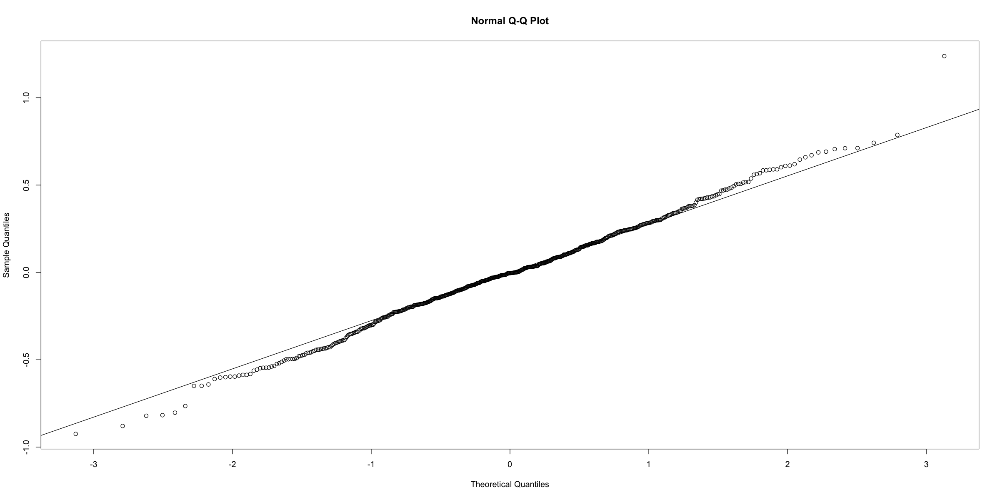

In [54]:
ggplot(sa_train,aes(x = index, y = arima_resids)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("ARIMA Model Residuals Over Time"),
    x = "Time",
    y = "Residuals"
  )

acf(sa_train[['arima_resids']])
pacf(sa_train[['arima_resids']])
qqnorm(sa_train[['arima_resids']])
qqline(sa_train[['arima_resids']])

#### Evaluate Performance on Test Set

In [55]:
sa_test[['arima_preds']] = data.frame(forecast(final_arima,h = dim(sa_test)[1]))[['Point.Forecast']]
sa_test[['final_preds']] = sa_test[['preds']] + sa_test[['arima_preds']]
sa_test[['final_resids']] = sa_test[['value']] - sa_test[['final_preds']]

1 - (sum(sa_test[['final_resids']]**2) / (var(sa_test[['value']]) * dim(sa_test)[1]))

[1] 0.7954636

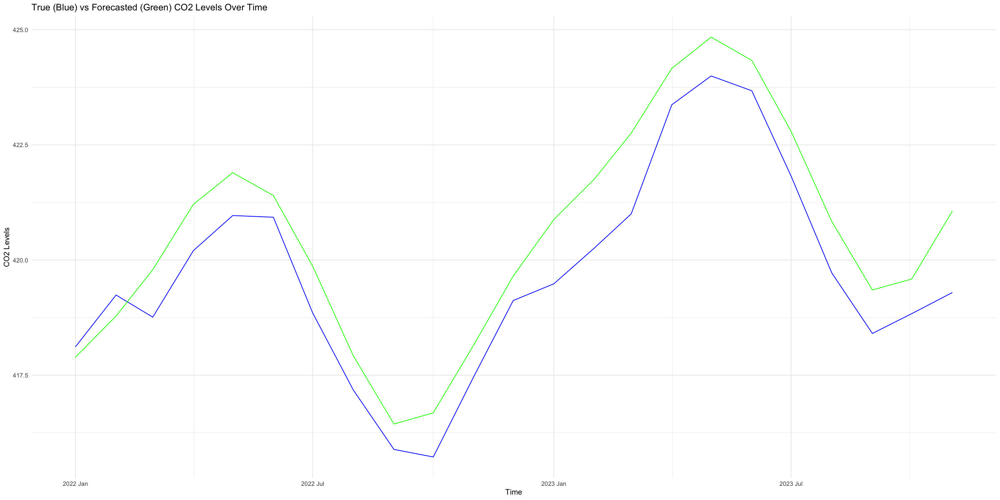

In [56]:
ggplot(sa_test) +
  geom_line(aes(x = index, y = value), color = 'blue') + 
  geom_line(aes(x = index, y = final_preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Forecasted (Green) CO2 Levels Over Time"),
    x = "Time",
    y = "CO2 Levels"
  )

### Retry Modeling Non Seasonally Adjusted Series Using Linear Model to Adjust

In [57]:
nsa = co2_present

nsa_train = subset(nsa,year < 2022)
nsa_test = subset(nsa, year >= 2022)

model = lm(value ~ index1 + index2 + log_index,data = nsa_train)
nsa_train[['preds']] = model$fitted.values
nsa_train[['diff_value']] = model$residuals

nsa_test[['preds']] = predict(model,nsa_test)
nsa_test[['diff_value']] = nsa_test[['value']] - nsa_test[['preds']]

`geom_smooth()` using formula = 'y ~ x'


$x
[1] "Time"

$y
[1] "Target Variable"

$title
[1] "SA Target Variable Over Time"

attr(,"class")
[1] "labels"

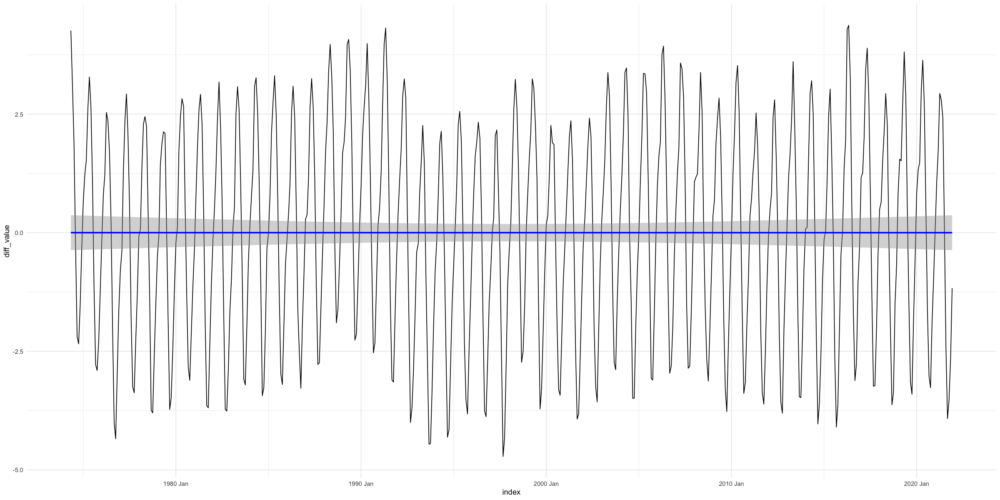

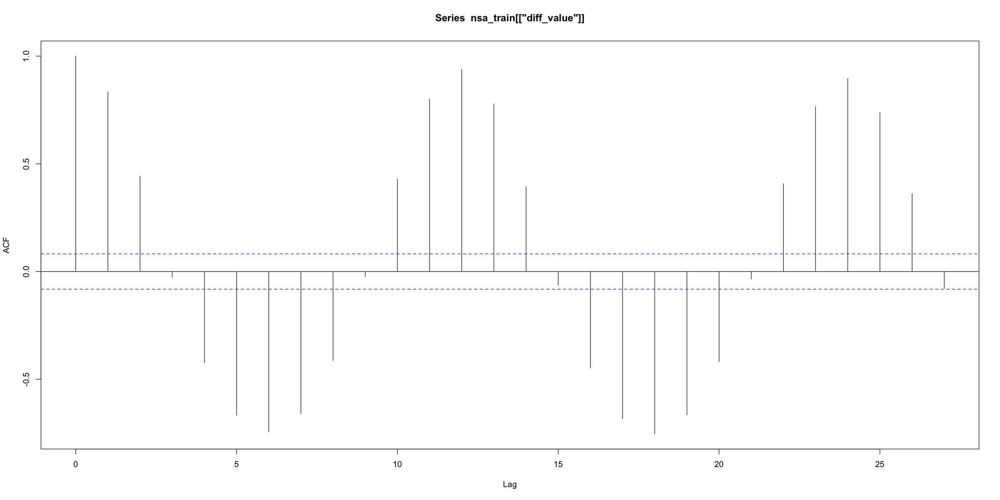

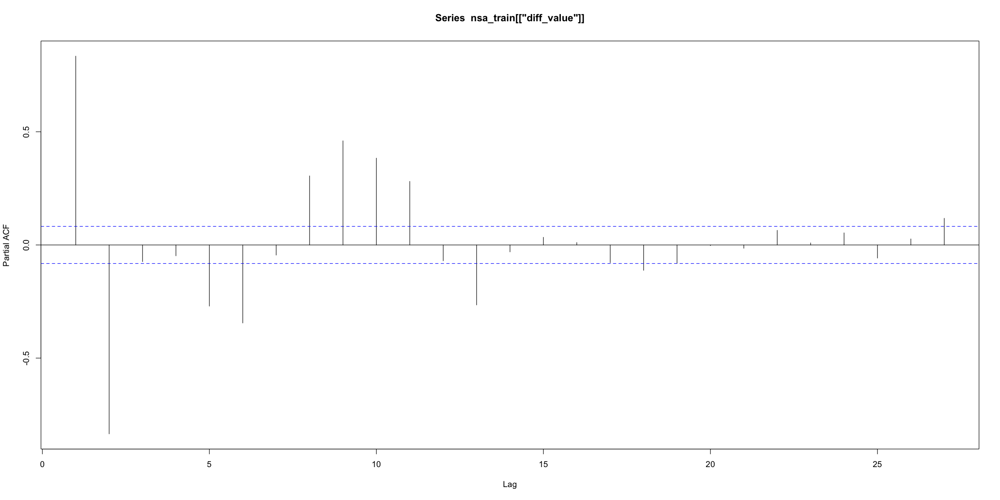

In [58]:
ggplot(nsa_train,aes(x = index, y = diff_value)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("SA Target Variable Over Time"),
    x = "Time",
    y = "Target Variable"
  )

acf(nsa_train[['diff_value']])
pacf(nsa_train[['diff_value']])

In [59]:
nsarows = list()

for (p in 1:12){
    
    for (q in 0:4) {
        
        
        suppressWarnings({model = arima(nsa_train[['diff_value']], order=c(p,0,q))})
        
        preds = data.frame(forecast(model,h=dim(nsa_test)[1]))[['Point.Forecast']]
        preds = nsa_test[['preds']] + preds
        true = nsa_test[['value']]
        
        r2 = 1 - sum((true - preds)**2) / (var(true)*length(true))
        rmse = sqrt(mean((true-preds)**2))
        mae = mean(abs(true-preds))
        
        suppressWarnings({
            nsarows = append(nsarows,c(p,q,BIC(model),r2,rmse,mae))
            
            })
    }
}

nsarows = data.frame(t(matrix(nsarows,nrow = 6)))
colnames(nsarows) = c('P','Q','BICVal','R2','RMSE','MAE')

for (col in colnames(nsarows)) {
    
    nsarows[[col]] = as.numeric(nsarows[[col]])
    
}

nsarows

P,Q,BICVal,R2,RMSE,MAE
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,0,1870.1271,-0.21809740,2.4289593,2.0849800
1,1,1509.1334,-0.20068442,2.4115355,2.0084020
1,2,1359.1659,-0.19002596,2.4008081,1.9658860
1,3,1265.9752,-0.18669605,2.3974468,1.9765173
1,4,1242.9799,-0.18713607,2.3978912,1.9771987
2,0,1138.0992,0.06878363,2.1237555,1.8124303
2,1,1144.0741,0.08662403,2.1033135,1.8024459
2,2,1134.1073,0.34238363,1.7847013,1.5273512
2,3,1123.8934,0.29440985,1.8486533,1.5660403


#### Final Arima Model, Use Linear Model Differencing Because it allows us to reconstruct forecasts farther out into the future even when arima model begins generating constant predictions

In [60]:
final_arima = arima(nsa_train[['diff_value']], order=c(5,0,4))
summary(final_arima)
1 - (sum(final_arima$residuals**2) / (var(nsa_train[['diff_value']]) * dim(nsa_train)[1]))


Call:
arima(x = nsa_train[["diff_value"]], order = c(5, 0, 4))

Coefficients:
         ar1      ar2     ar3      ar4     ar5      ma1     ma2      ma3
      3.5764  -6.0393  5.8857  -3.3103  0.8463  -2.7230  3.6641  -2.6518
s.e.  0.0248   0.0677  0.0923   0.0675  0.0247   0.0165  0.0392   0.0459
         ma4  intercept
      0.9590     0.0252
s.e.  0.0233     0.0894

sigma^2 estimated as 0.1282:  log likelihood = -235.6,  aic = 493.2

Training set error measures:
                       ME      RMSE       MAE      MPE     MAPE      MASE
Training set -0.003878139 0.3580101 0.2788399 32.79529 81.24292 0.2537869
                   ACF1
Training set -0.1205072

[1] 0.9744089

#### Evaluate Residuals

In [61]:
nsa_train[['arima_resids']] = final_arima$residuals

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
`geom_smooth()` using formula = 'y ~ x'


$x
[1] "Time"

$y
[1] "Residuals"

$title
[1] "ARIMA Model Residuals Over Time"

attr(,"class")
[1] "labels"

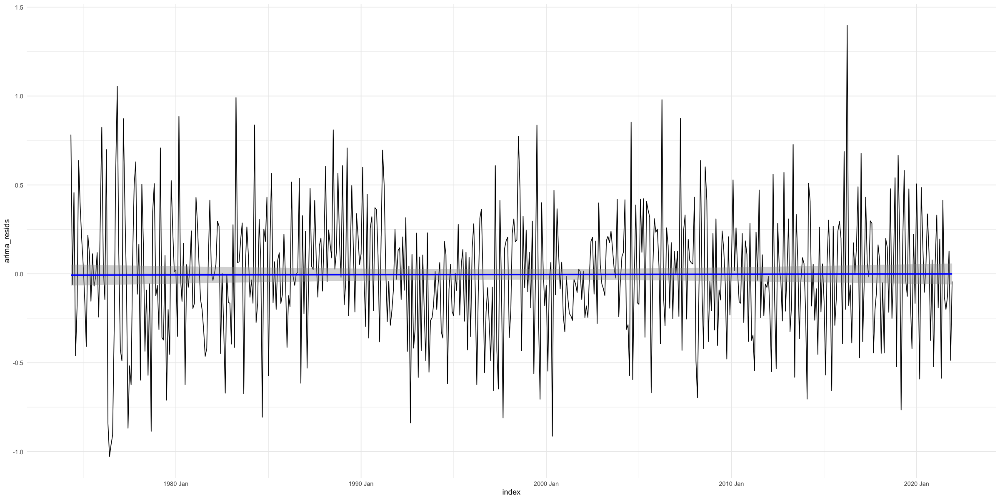

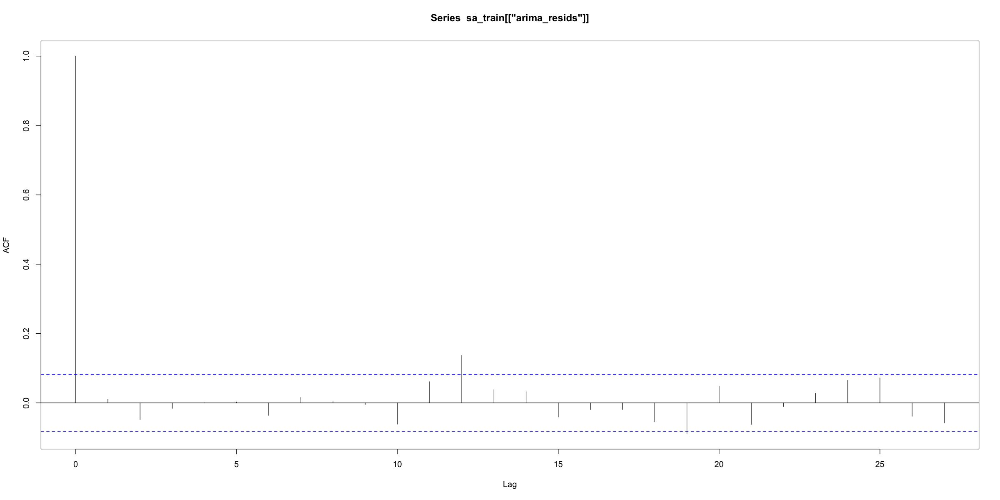

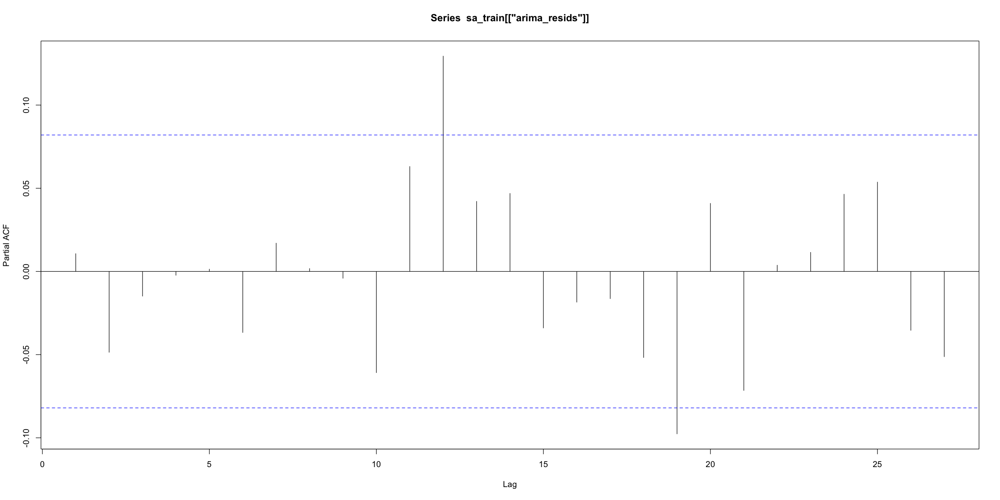

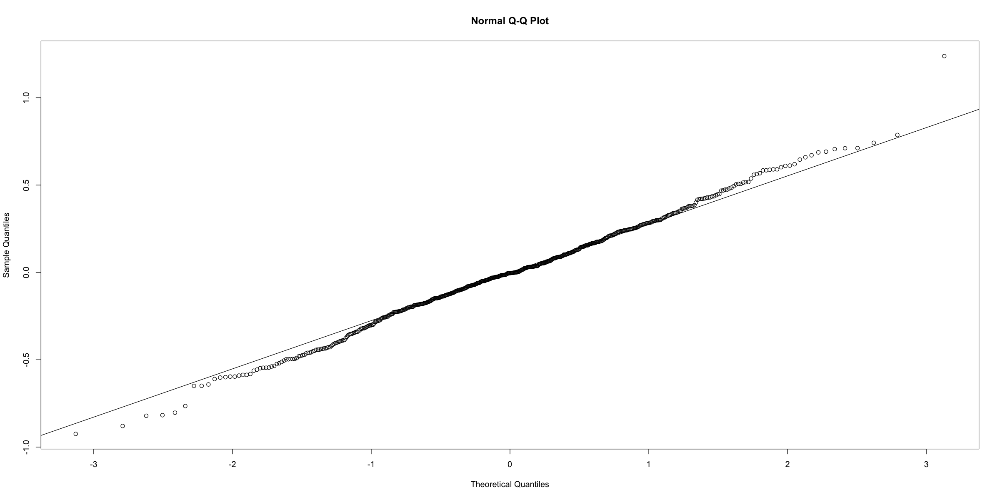

In [62]:
ggplot(nsa_train,aes(x = index, y = arima_resids)) +
  geom_line() + 
  geom_smooth(method = 'lm',color = 'blue')

  labs(
    title = paste("ARIMA Model Residuals Over Time"),
    x = "Time",
    y = "Residuals"
  )

acf(sa_train[['arima_resids']])
pacf(sa_train[['arima_resids']])
qqnorm(sa_train[['arima_resids']])
qqline(sa_train[['arima_resids']])

#### Evaluate Performance on Test Set

In [63]:
nsa_test[['arima_preds']] = data.frame(forecast(final_arima,h = dim(nsa_test)[1]))[['Point.Forecast']]
nsa_test[['final_preds']] = nsa_test[['preds']] + nsa_test[['arima_preds']]
nsa_test[['final_resids']] = nsa_test[['value']] - nsa_test[['final_preds']]

1 - (sum(nsa_test[['final_resids']]**2) / (var(nsa_test[['value']]) * dim(nsa_test)[1]))

[1] 0.7880835

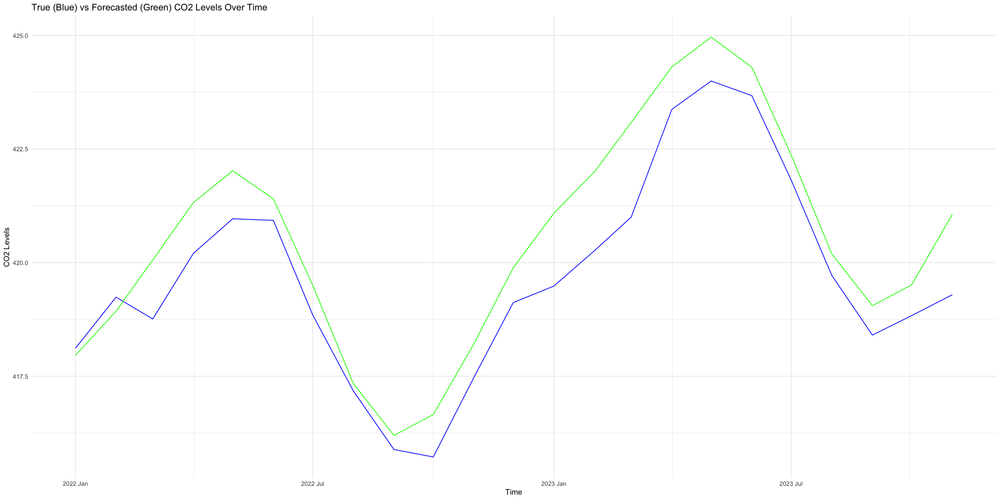

In [64]:
ggplot(nsa_test) +
  geom_line(aes(x = index, y = value), color = 'blue') + 
  geom_line(aes(x = index, y = final_preds), color = 'green') +

  labs(
    title = paste("True (Blue) vs Forecasted (Green) CO2 Levels Over Time"),
    x = "Time",
    y = "CO2 Levels"
  )

## (3 points) Task Part 6b: How bad could it get?

With the non-seasonally adjusted data series, generate predictions for when atmospheric CO2 is expected to be at 420 ppm and 500 ppm levels for the first and final times (consider prediction intervals as well as point estimates in your answer). Generate a prediction for atmospheric CO2 levels in the year 2122. How confident are you that these will be accurate predictions?

In [65]:
nsa = co2_present
nsa = subset(nsa,year < 2022)
model = lm(value~index1 + index2 + log_index, data = nsa)
nsa[['preds']] = model$fitted_values
nsa[['diff_value']] = model$residuals
arima_model = arima(nsa[['diff_value']], order=c(5,0,4))

In [66]:
start_year = 2022
end_year = 2122
start_index = 757
month_count = 1

rows = data.frame()
count = 1
while (start_year < end_year){
    row = c(year = start_year,
               index1 = start_index,
               index2 = start_index**2, 
               index3 = start_index**3,
               log_index = log(start_index),
               month = m_val[[paste(month_count)]])
    rows = append(rows,row)
    count = count + 1
    start_index = start_index + 1
    month_count = month_count + 1
    if (month_count >= 13){
        month_count = 1
        start_year = start_year + 1
    }
}

rows = data.frame(t(matrix(rows,nrow = 6)))
colnames(rows) = c('year','index1','index2','index3','log_index','month')

for (col in c('index1','index2','index3','log_index')) {
    rows[[col]] = as.numeric(rows[[col]])
}

for (col in c('year','month')) {
    rows[[col]] = as.character(rows[[col]])
}

rows[['preds']] = predict(model,rows)
rows[['arima_preds']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Point.Forecast']]
rows[['arima_lb']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Lo.95']]
rows[['arima_ub']] = data.frame(forecast(arima_model,h=dim(rows)[1]))[['Hi.95']]

rows[['final_preds']] = rows[['preds']] + rows[['arima_preds']]

rows[['spot420']] = 420
rows[['spot500']] = 500

head(rows)

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,2022,757,573049,433798093,6.629363,Jan,418.0770,-0.1173169,-0.8199815,0.5853478,417.9596,420,500
2,2022,758,574564,435519512,6.630683,Feb,418.3017,0.6293859,-0.2954877,1.5542595,418.9311,420,500
3,2022,759,576081,437245479,6.632002,Mar,418.5268,1.5323076,0.4911225,2.5734926,420.0591,420,500
4,2022,760,577600,438976000,6.633318,Apr,418.7522,2.5706146,1.4708299,3.6703993,421.3228,420,500
5,2022,761,579121,440711081,6.634633,May,418.9780,3.0442992,1.9132274,4.1753709,422.0223,420,500
6,2022,762,580644,442450728,6.635947,Jun,419.2040,2.1998914,1.0468247,3.3529581,421.4039,420,500


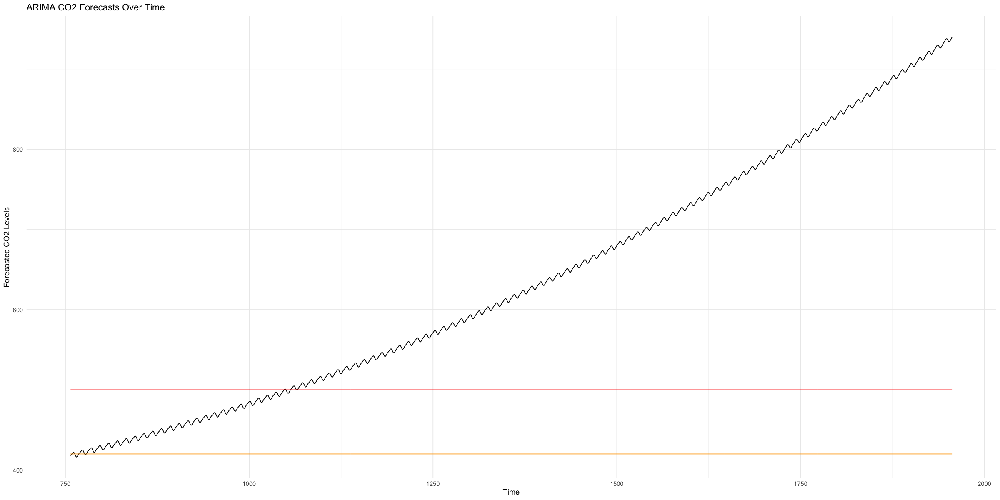

In [67]:
ggplot(rows) +
  geom_line(aes(x = index1, y = final_preds)) +
  geom_line(aes(x = index1, y = spot420), color = 'orange') + 
  geom_line(aes(x = index1, y = spot500), color = 'red') + 

  labs(
    title = 'ARIMA CO2 Forecasts Over Time',
    x = "Time",
    y = "Forecasted CO2 Levels"
  )

### First and Final Time at 420, Mar 2022 - Jul 2022

In [68]:
subset(rows,final_preds >= 419.5 & preds < 420.5)

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
3,2022,759,576081,437245479,6.632002,Mar,418.5268,1.53230755,0.4911225,2.573493,420.0591,420,500
4,2022,760,577600,438976000,6.633318,Apr,418.7522,2.57061462,1.4708299,3.670399,421.3228,420,500
5,2022,761,579121,440711081,6.634633,May,418.9780,3.04429916,1.9132274,4.175371,422.0223,420,500
6,2022,762,580644,442450728,6.635947,Jun,419.2040,2.19989142,1.0468247,3.352958,421.4039,420,500
7,2022,763,582169,444194947,6.637258,Jul,419.4304,0.07332482,-1.0999391,1.246589,419.5037,420,500


### First and Final time at 500, Apr 2046 - Jan 2047

In [69]:
subset(rows,final_preds >= 499.5 & preds < 500.5)

,year,index1,index2,index3,log_index,month,preds,arima_preds,arima_lb,arima_ub,final_preds,spot420,spot500
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
292,2046,1048,1098304,1151022592,6.954639,Apr,497.5264,3.0228536,1.6311001,4.414607,500.5493,420,500
293,2046,1049,1100401,1154320649,6.955593,May,497.8494,3.2003223,1.8069555,4.593689,501.0498,420,500
294,2046,1050,1102500,1157625000,6.956545,Jun,498.1728,1.9876249,0.5934260,3.381824,500.1604,420,500
300,2046,1056,1115136,1177583616,6.962243,Dec,500.1204,-0.3856825,-1.7805265,1.009161,499.7347,420,500
301,2047,1057,1117249,1180932193,6.963190,Jan,500.4462,0.4481315,-0.9479595,1.844222,500.8943,420,500
